#ML Project - Machine Learning Pipeline on a Customer Churn Classification Dataset



importing neccessary libraries

## Importing the Dataset

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
##from sklearn.preprocessing import StandardScaler, LabelEncoder
##from imblearn.over_sampling import SMOTE
##from sklearn.model_selection import train_test_split

importing the dataset

In [4]:
df=pd.read_excel('/content/credit_card_churn_dataset_V4.xlsx')

# Dataset Analysis and preprocessing

we then know the size/dimensions of the dataset

In [5]:
print("Dataset dimensions:",df.shape)

Dataset dimensions: (20000, 60)


Therefore, the dataset size and dimensions is **20000 rows** and **60 coloumns (fields) including the target**

In [6]:
df.head()

,index,monthly_spend_cash,monthly_spend_payments,monthly_spend_installments,monthly_spend_subscriptions,monthly_spend_travel,monthly_spend_dining,monthly_spend_shopping,total_spend_last_month,total_spend_last_3_months,...,marital_status,education_level,employment_status,num_dependents,residence_type,years_at_residence,months_since_last_txn,utilization_ratio,inactivity_flag,month_key
0,5464,4664.0,7438.0,15398.000000,760,4884.056742,2211,6555.000000,40001,134147.488984,...,Single,Master,Unemployed,3,Owned,8,4,0.052633,1,2023-01
1,2042,NaN,8252.0,18864.429771,665,2970.000000,920,6430.319172,32342,101638.757719,...,Married,Master,Unemployed,1,Owned,15,5,0.063416,1,2023-01
2,8669,1408.0,5199.0,4964.000000,882,1167.000000,2418,4967.000000,21005,52898.328993,...,Single,Master,Employed,0,Owned,9,2,0.067758,0,2023-01
3,1115,NaN,1837.0,18270.000000,722,4808.275207,43,5992.000000,30275,86390.416083,...,Married,Master,Self-Employed,0,Rented,9,5,0.058221,1,2023-01
4,4078,4134.0,7530.0,18272.775610,166,3256.000000,2736,7506.437574,23050,74438.420532,...,Married,Master,Employed,4,Rented,2,0,0.057625,0,2023-01


as seen from  the sample fo the data some fields have null values aka **NaN** which will then be managed

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 60 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   index                               20000 non-null  int64         
 1   monthly_spend_cash                  17985 non-null  float64       
 2   monthly_spend_payments              18030 non-null  float64       
 3   monthly_spend_installments          18482 non-null  float64       
 4   monthly_spend_subscriptions         20000 non-null  int64         
 5   monthly_spend_travel                20000 non-null  float64       
 6   monthly_spend_dining                20000 non-null  int64         
 7   monthly_spend_shopping              20000 non-null  float64       
 8   total_spend_last_month              20000 non-null  int64         
 9   total_spend_last_3_months           20000 non-null  float64       
 10  total_spend_last_6_mon

if there were to be a single value in a field that is the same across all the records we were to delete it, but its not the case here.

In [8]:
df.isnull().sum()

,0
index,0
monthly_spend_cash,2015
monthly_spend_payments,1970
monthly_spend_installments,1518
monthly_spend_subscriptions,0
monthly_spend_travel,0
monthly_spend_dining,0
monthly_spend_shopping,0
total_spend_last_month,0
total_spend_last_3_months,0


In [9]:
(df.isnull().sum() / df.shape[0])*100

,0
index,0.000
monthly_spend_cash,10.075
monthly_spend_payments,9.850
monthly_spend_installments,7.590
monthly_spend_subscriptions,0.000
monthly_spend_travel,0.000
monthly_spend_dining,0.000
monthly_spend_shopping,0.000
total_spend_last_month,0.000
total_spend_last_3_months,0.000


###we show the number of nulls in each field:
    *   If The feature has **>40% missing** values and is not critical, we can **drop** it.
    *   If The feature is predictive or business-critical and **not significant number of nulls** we can then **impute**.



but here if 2000 or 4000 then about 10% or 20% which is not a significant portion so no need to drop, we can just impute for now.

In [10]:
df.nunique()

,0
index,10000
monthly_spend_cash,4142
monthly_spend_payments,5959
monthly_spend_installments,10840
monthly_spend_subscriptions,1000
monthly_spend_travel,8781
monthly_spend_dining,2898
monthly_spend_shopping,9988
total_spend_last_month,9188
total_spend_last_3_months,10000


Checking for unique values for each field, if it were **1 unique value** it would be useless so we would drop it, also if **20000 unique values we would drop** it because also there is no specific pattern.

So we drop the act_ref_num becuase has 20000 values which means no certain pattern is made from it.

In [11]:
print("Duplicated Columns:", df.duplicated().sum())

Duplicated Columns: 0


In [12]:

# Identifying garbage values in `string` objects
for feature in df.select_dtypes(include = "object").columns:
    print("=" * 10, "Feature:", feature, "=" * 10)
    print(df[feature].value_counts()) # Displays a value and it's count
    print() # New Line

========== Feature: spend_volatility ==========
spend_volatility
High      6733
Low       6675
Medium    6592
Name: count, dtype: int64

========== Feature: account_types ==========
account_types
investment    5051
savings       5038
loan          5029
checking      4882
Name: count, dtype: int64

========== Feature: act_ref_num ==========
act_ref_num
ACC_00019984    1
ACC_00019983    1
ACC_00019982    1
ACC_00019981    1
ACC_00019980    1
               ..
ACC_00000005    1
ACC_00000004    1
ACC_00000003    1
ACC_00000002    1
ACC_00000001    1
Name: count, Length: 20000, dtype: int64

========== Feature: plastic_masked_pan ==========
plastic_masked_pan
**** **** **** 9418    10
**** **** **** 7984     9
**** **** **** 7103     9
**** **** **** 6883     8
**** **** **** 8342     8
                       ..
**** **** **** 7141     1
**** **** **** 2124     1
**** **** **** 3593     1
**** **** **** 5243     1
**** **** **** 2436     1
Name: count, Length: 8008, dtype: int64

==========

Dropping Irrelavent fields

Irrelevant becuase unique

Irrelavent because its ID and unique for each customer

we will drop plastic_masked_pan because its masked so no pattern and all the same , irrelevant to judge whether will churn or not

In [13]:
df.head()

,index,monthly_spend_cash,monthly_spend_payments,monthly_spend_installments,monthly_spend_subscriptions,monthly_spend_travel,monthly_spend_dining,monthly_spend_shopping,total_spend_last_month,total_spend_last_3_months,...,marital_status,education_level,employment_status,num_dependents,residence_type,years_at_residence,months_since_last_txn,utilization_ratio,inactivity_flag,month_key
0,5464,4664.0,7438.0,15398.000000,760,4884.056742,2211,6555.000000,40001,134147.488984,...,Single,Master,Unemployed,3,Owned,8,4,0.052633,1,2023-01
1,2042,NaN,8252.0,18864.429771,665,2970.000000,920,6430.319172,32342,101638.757719,...,Married,Master,Unemployed,1,Owned,15,5,0.063416,1,2023-01
2,8669,1408.0,5199.0,4964.000000,882,1167.000000,2418,4967.000000,21005,52898.328993,...,Single,Master,Employed,0,Owned,9,2,0.067758,0,2023-01
3,1115,NaN,1837.0,18270.000000,722,4808.275207,43,5992.000000,30275,86390.416083,...,Married,Master,Self-Employed,0,Rented,9,5,0.058221,1,2023-01
4,4078,4134.0,7530.0,18272.775610,166,3256.000000,2736,7506.437574,23050,74438.420532,...,Married,Master,Employed,4,Rented,2,0,0.057625,0,2023-01


In [14]:
df.describe()

,index,monthly_spend_cash,monthly_spend_payments,monthly_spend_installments,monthly_spend_subscriptions,monthly_spend_travel,monthly_spend_dining,monthly_spend_shopping,total_spend_last_month,total_spend_last_3_months,...,num_other_products,loyalty_score,transaction_frequency,total_bank_balance,age,num_dependents,years_at_residence,months_since_last_txn,utilization_ratio,inactivity_flag
count,20000.000000,17985.000000,18030.000000,18482.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,...,20000.000000,17985.000000,20000.000000,17985.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000
mean,4990.932100,2517.592994,5070.738769,12244.760672,498.474700,2987.020820,1487.794250,4861.027906,30047.378400,78388.765800,...,20.978200,197.475730,29.479650,316267.023803,42.533250,1.986500,9.973750,2.502400,0.061347,0.502750
min,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,3846.000000,10296.162581,...,1.000000,4.200000,10.000000,47239.300683,21.000000,0.000000,1.000000,0.000000,0.049653,0.000000
25%,2505.000000,1281.000000,2592.500000,6990.750000,245.000000,1664.000000,726.000000,2750.000000,21120.000000,61445.145624,...,6.000000,128.400000,19.000000,252942.603208,32.000000,1.000000,5.000000,1.000000,0.057664,0.000000
50%,4982.000000,2489.000000,5096.000000,13841.000000,501.000000,3306.000000,1486.000000,5474.500000,26625.000000,77892.042689,...,25.000000,194.650000,30.000000,314843.408621,42.000000,2.000000,10.000000,3.000000,0.061115,1.000000
75%,7494.000000,3803.000000,7625.000000,17646.683475,747.000000,4368.855641,2239.000000,7024.042983,32388.250000,94156.316446,...,33.000000,261.450000,39.000000,380209.616918,53.000000,3.000000,15.000000,4.000000,0.064814,1.000000
max,10000.000000,4999.000000,9999.000000,19999.000000,999.000000,4999.000000,2999.000000,7998.692546,178496.000000,159479.352421,...,40.000000,493.950000,49.000000,603073.515733,64.000000,4.000000,19.000000,5.000000,0.075247,1.000000
std,2883.835795,1445.046573,2901.525216,6090.257790,288.664534,1531.718401,868.105031,2437.023501,19671.718004,23247.350402,...,13.413155,90.343228,11.567337,88549.282089,12.610585,1.425244,5.488512,1.697775,0.004913,0.500005


#EDA (Exploratory Data Analysis)

In [15]:
import math

def visualize_diagram(diagram_name):
    # Dynamically calculate rows and columns based on the number of numeric features
    num_features = 60
    columns = 3 # You can adjust this number
    rows = 20

    # Create the big plot with specific dimensions
    plt.figure(figsize=(5 * columns, 4 * rows))

    # Iterate over the features & create the histograms
    for i, col in enumerate(numeric_columns):
        plt.subplot(rows, columns, i + 1) # +1 because Matplotlib starts from index 1 in the plots
        if diagram_name == "Histogram":
            sns.histplot(data=df, x=col)
        elif diagram_name == "Boxplot":
            sns.boxplot(data=df, x=col)

    plt.tight_layout()
    plt.show()

In [16]:

# Select numeric columns - returns a list (not dateframe)
numeric_columns = df.select_dtypes(include="number").columns

# Store the numeric columns length (18 features)
numeric_columns_length = len(numeric_columns)

print("Number of numeric columns/features:", numeric_columns_length)

Number of numeric columns/features: 48


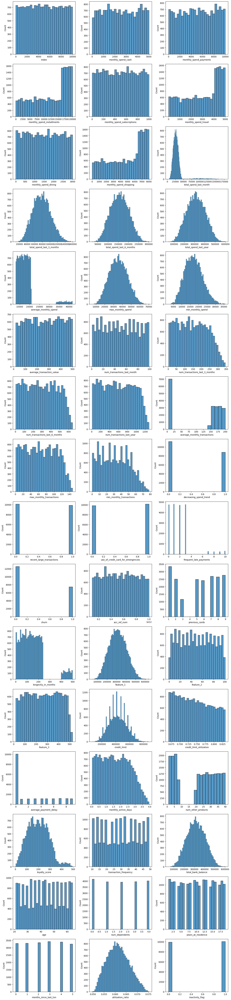

In [17]:
visualize_diagram("Histogram")

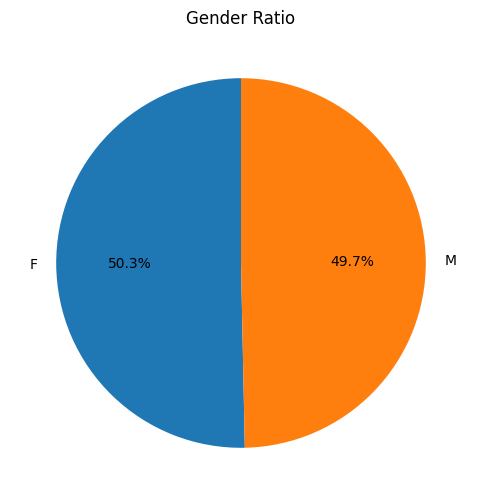

gender
F    10066
M     9934
Name: count, dtype: int64
gender
F    50.33
M    49.67
Name: count, dtype: float64


In [18]:
# =========================================
# 3. Gender Ratio (Male vs Female)
# =========================================
# Replace 'gender' with your actual column name
plt.figure(figsize=(6, 6))
gender_counts = df['gender'].value_counts()
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=90)
plt.title("Gender Ratio")
plt.show()

print(gender_counts)
print((gender_counts / gender_counts.sum() * 100).round(2))

In [19]:
#def visualize_scatter_index():
#    numeric_columns = df.select_dtypes(include="number").columns
#
 #   columns = 3
  #  rows = math.ceil(len(numeric_columns) / columns)
#
#    plt.figure(figsize=(5 * columns, 4 * rows))
#
 #   for i, col in enumerate(numeric_columns):
  #      plt.subplot(rows, columns, i + 1)
   #     sns.scatterplot(x=df.index, y=df[col], alpha=0.4, s=10)
    #    plt.title(col)

    #plt.tight_layout()
    #plt.show()

#visualize_scatter_index()

Found 65 pairs with |correlation| > 0.7
total_spend_last_year        total_bank_balance                0.999872
feature_1                    credit_limit                      0.999468
num_transactions_last_month  feature_2                         0.998771
average_transaction_value    feature_3                         0.998104
num_transactions_last_month  num_transactions_last_6_months    0.995474
                                                                 ...   
previous_cards               num_other_products                0.835006
monthly_spend_cash           loyalty_score                     0.805541
credit_limit_utilization     utilization_ratio                 0.794846
churn                        inactivity_flag                   0.763931
average_monthly_spend        frequent_late_payments            0.729918
Length: 65, dtype: float64


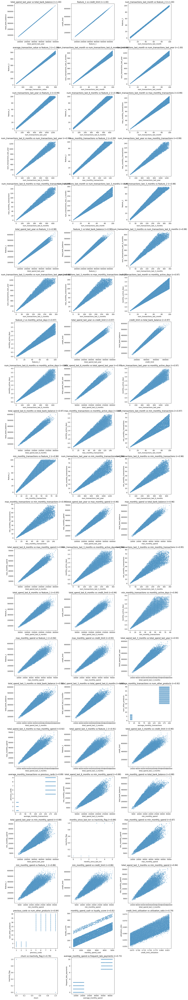

In [20]:
def scatter_top_correlations(threshold=0.7):
    numeric_columns = df.select_dtypes(include="number").columns
    corr = df[numeric_columns].corr()

    # Get strongly correlated pairs (excluding self-correlation and duplicates)
    corr_pairs = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool)).stack()
    strong_pairs = corr_pairs[corr_pairs.abs() > threshold].sort_values(key=abs, ascending=False)

    print(f"Found {len(strong_pairs)} pairs with |correlation| > {threshold}")
    print(strong_pairs)

    if len(strong_pairs) == 0:
        print("No pairs found above this threshold. Try lowering it.")
        return

    pairs_to_plot = strong_pairs.index.tolist()  # list of (col1, col2) tuples

    columns = 3
    rows = math.ceil(len(pairs_to_plot) / columns)

    plt.figure(figsize=(5 * columns, 4 * rows))

    for i, (col1, col2) in enumerate(pairs_to_plot):
        plt.subplot(rows, columns, i + 1)
        sns.scatterplot(data=df, x=col1, y=col2, alpha=0.4, s=10)
        r_val = strong_pairs[(col1, col2)]
        plt.title(f"{col1} vs {col2} (r={r_val:.2f})")

    plt.tight_layout()
    plt.show()

scatter_top_correlations(threshold=0.7)

In [21]:
def visualize_diagram(diagram_name):
    # Always pull only numeric columns fresh from df, in case df changed
    numeric_columns = df.select_dtypes(include="number").columns

    columns = 3
    rows = math.ceil(len(numeric_columns) / columns)

    plt.figure(figsize=(5 * columns, 4 * rows))

    for i, col in enumerate(numeric_columns):
        plt.subplot(rows, columns, i + 1)
        if diagram_name == "Histogram":
            sns.histplot(data=df, x=col)
        elif diagram_name == "Boxplot":
            sns.boxplot(data=df, x=col)

    plt.tight_layout()
    plt.show()

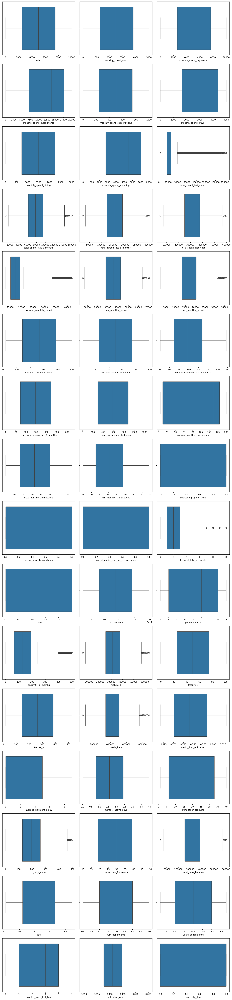

In [22]:

visualize_diagram("Boxplot")

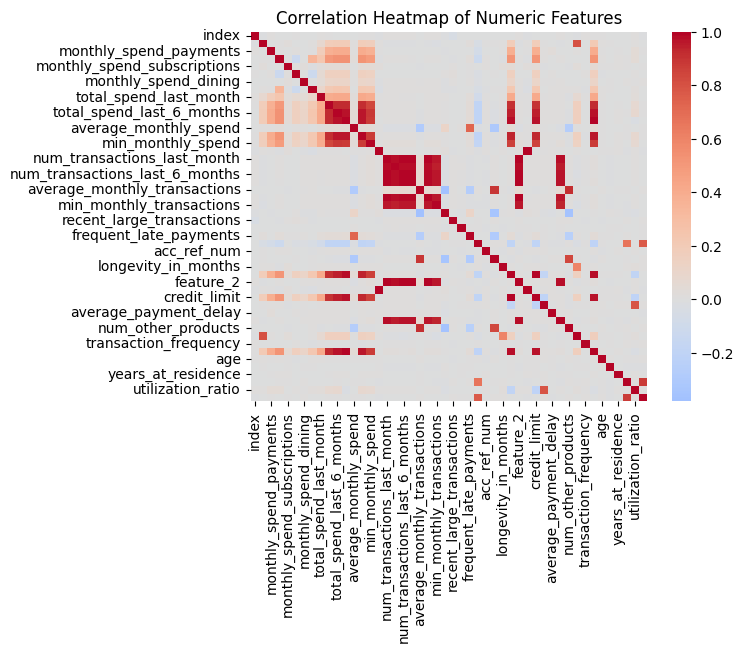

total_spend_last_year        total_bank_balance                0.999872
feature_1                    credit_limit                      0.999468
num_transactions_last_month  feature_2                         0.998771
average_transaction_value    feature_3                         0.998104
num_transactions_last_month  num_transactions_last_6_months    0.995474
                                                                 ...   
monthly_spend_installments   max_monthly_spend                 0.529762
                             total_bank_balance                0.527334
                             feature_1                         0.519041
                             credit_limit                      0.516204
                             total_spend_last_3_months         0.508606
Length: 74, dtype: float64


In [23]:
corr = df[numeric_columns].corr()
sns.heatmap(corr, annot=False, cmap="coolwarm", center=0)
plt.title("Correlation Heatmap of Numeric Features")
plt.show()

# If you want to see only strong correlations (|corr| > 0.5) as a table:
strong_corr = corr[(corr.abs() > 0.5) & (corr != 1.0)].stack().drop_duplicates()
print(strong_corr.sort_values(ascending=False))

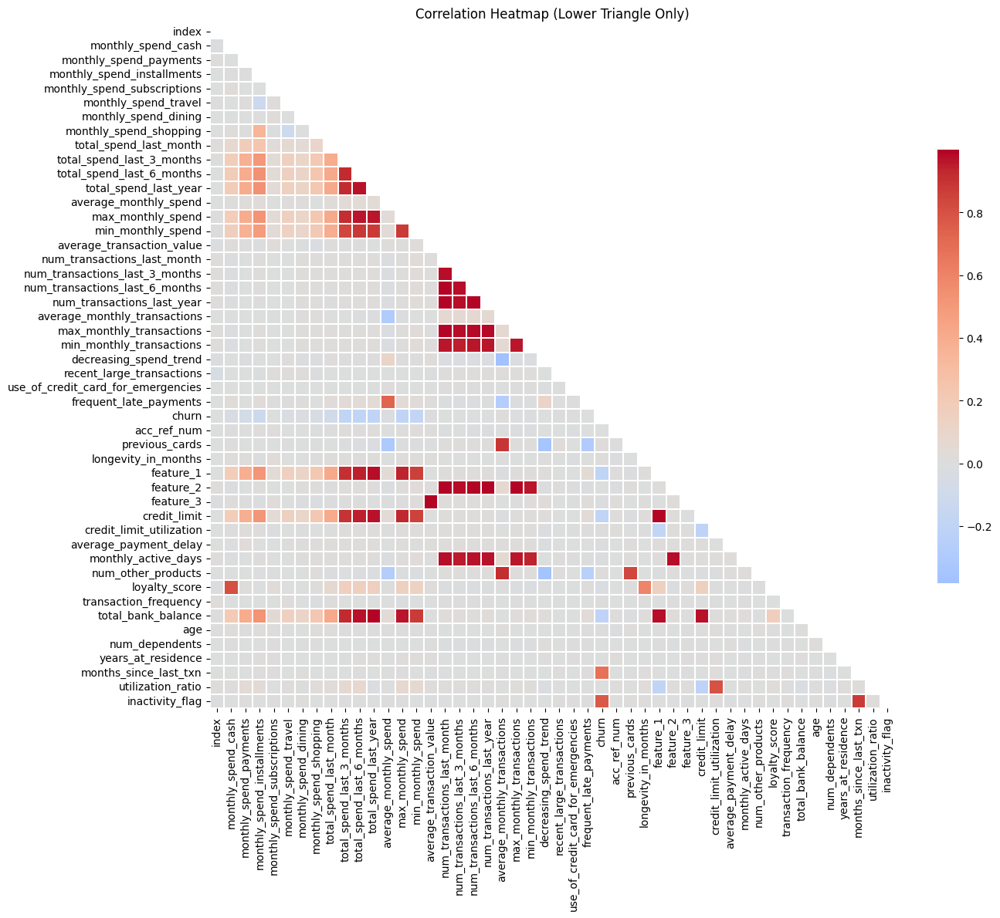

In [24]:
plt.figure(figsize=(14, 12))
mask = np.triu(np.ones_like(corr, dtype=bool))  # hide upper triangle (duplicate info)
sns.heatmap(corr, mask=mask, cmap="coolwarm", center=0, annot=False,
            square=True, linewidths=0.3, cbar_kws={"shrink": 0.6})
plt.title("Correlation Heatmap (Lower Triangle Only)")
plt.tight_layout()
plt.show()

Features involved in strong correlations: 32


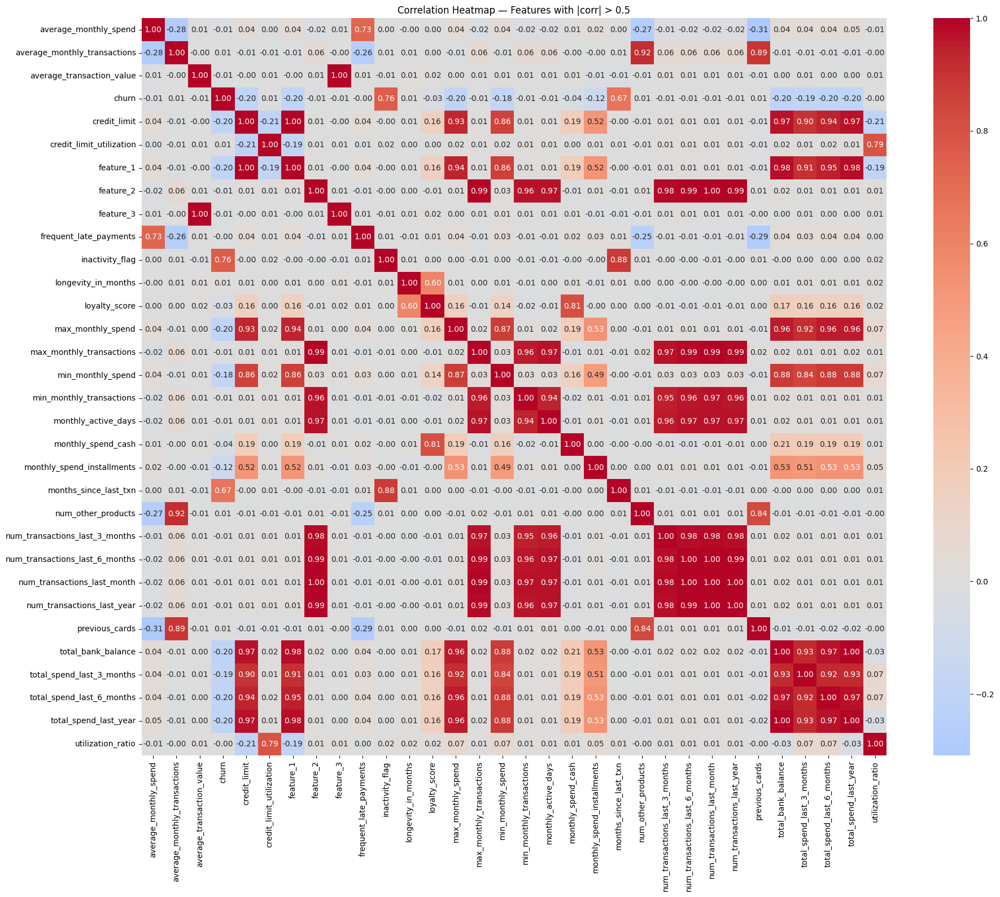


Top correlated pairs:
total_spend_last_year        total_bank_balance                0.999872
feature_1                    credit_limit                      0.999468
num_transactions_last_month  feature_2                         0.998771
average_transaction_value    feature_3                         0.998104
num_transactions_last_month  num_transactions_last_6_months    0.995474
                                                                 ...   
monthly_spend_installments   max_monthly_spend                 0.529762
                             total_bank_balance                0.527334
                             feature_1                         0.519041
                             credit_limit                      0.516204
                             total_spend_last_3_months         0.508606
Length: 74, dtype: float64


In [25]:
# ============================================
strong_corr = corr[(corr.abs() > 0.5) & (corr != 1.0)].stack().drop_duplicates()
strong_corr = strong_corr.sort_values(ascending=False)

# Get the unique column names involved in any strong correlation
involved_cols = sorted(set([c for pair in strong_corr.index for c in pair]))
print(f"Features involved in strong correlations: {len(involved_cols)}")

if involved_cols:
    small_corr = df[involved_cols].corr()
    plt.figure(figsize=(max(8, len(involved_cols) * 0.6), max(6, len(involved_cols) * 0.5)))
    sns.heatmap(small_corr, annot=True, fmt=".2f", cmap="coolwarm", center=0)
    plt.title("Correlation Heatmap — Features with |corr| > 0.5")
    plt.tight_layout()
    plt.show()
else:
    print("No strong correlations found above threshold.")

print("\nTop correlated pairs:")
print(strong_corr)

In [26]:
numeric_columns = df.select_dtypes(include="number").columns
corr = df[numeric_columns].corr()

# Get unique feature pairs with correlation > 0.7
corr_pairs = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool)).stack()
top_corr = corr_pairs[corr_pairs.abs() > 0.7].sort_values(key=abs, ascending=False)

# Print as a simple ranked list
for rank, ((col1, col2), value) in enumerate(top_corr.items(), start=1):
    print(f"{rank}. {col1} & {col2} -> correlation = {value:.3f}")

1. total_spend_last_year & total_bank_balance -> correlation = 1.000
2. feature_1 & credit_limit -> correlation = 0.999
3. num_transactions_last_month & feature_2 -> correlation = 0.999
4. average_transaction_value & feature_3 -> correlation = 0.998
5. num_transactions_last_month & num_transactions_last_6_months -> correlation = 0.995
6. num_transactions_last_month & num_transactions_last_year -> correlation = 0.995
7. num_transactions_last_year & feature_2 -> correlation = 0.994
8. num_transactions_last_6_months & feature_2 -> correlation = 0.994
9. num_transactions_last_month & max_monthly_transactions -> correlation = 0.992
10. num_transactions_last_6_months & num_transactions_last_year -> correlation = 0.991
11. max_monthly_transactions & feature_2 -> correlation = 0.991
12. num_transactions_last_year & max_monthly_transactions -> correlation = 0.988
13. num_transactions_last_6_months & max_monthly_transactions -> correlation = 0.987
14. num_transactions_last_month & num_transactio

In [27]:
numeric_columns = df.select_dtypes(include="number").columns
corr = df[numeric_columns].corr()

# Get unique feature pairs with correlation > 0.7
corr_pairs = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool)).stack()
top_corr = corr_pairs[corr_pairs.abs() > 0.7].sort_values(key=abs, ascending=False)

# Print as a clean aligned table
print(f"{'Rank':<6}{'Feature 1':<30}{'Feature 2':<30}{'Correlation':>12}")
print("-" * 78)

for rank, ((col1, col2), value) in enumerate(top_corr.items(), start=1):
    print(f"{rank:<6}{col1:<30}{col2:<30}{value:>12.3f}")

Rank  Feature 1                     Feature 2                      Correlation
------------------------------------------------------------------------------
1     total_spend_last_year         total_bank_balance                   1.000
2     feature_1                     credit_limit                         0.999
3     num_transactions_last_month   feature_2                            0.999
4     average_transaction_value     feature_3                            0.998
5     num_transactions_last_month   num_transactions_last_6_months       0.995
6     num_transactions_last_month   num_transactions_last_year           0.995
7     num_transactions_last_year    feature_2                            0.994
8     num_transactions_last_6_monthsfeature_2                            0.994
9     num_transactions_last_month   max_monthly_transactions             0.992
10    num_transactions_last_6_monthsnum_transactions_last_year           0.991
11    max_monthly_transactions      feature_2       

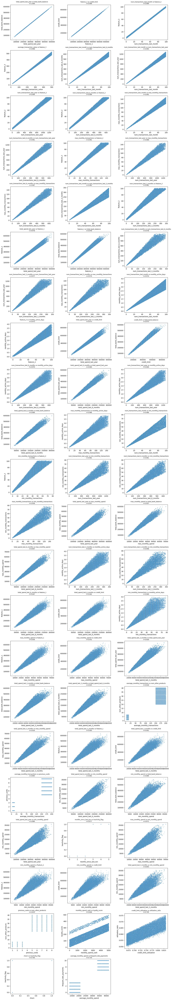

In [28]:
pairs_to_plot = top_corr.index.tolist()  # list of (col1, col2) tuples
values = top_corr.values

columns = 3
rows = math.ceil(len(pairs_to_plot) / columns)

plt.figure(figsize=(5 * columns, 4 * rows))

for i, ((col1, col2), r_val) in enumerate(zip(pairs_to_plot, values)):
    plt.subplot(rows, columns, i + 1)
    sns.scatterplot(data=df, x=col1, y=col2, alpha=0.4, s=10)
    plt.title(f"{col1} vs {col2}\nr={r_val:.3f}", fontsize=9)

plt.tight_layout()
plt.show()

In [29]:
# Get all unique features involved in the top correlated pairs (excluding churn itself)
unique_features = set()
for col1, col2 in top_corr.index:
    unique_features.add(col1)
    unique_features.add(col2)

unique_features.discard('churn')  # exclude churn itself, we're comparing features TO churn
unique_features = sorted(unique_features)

print(f"Number of unique features to check against churn: {len(unique_features)}")
print(unique_features)

Number of unique features to check against churn: 29
['average_monthly_spend', 'average_monthly_transactions', 'average_transaction_value', 'credit_limit', 'credit_limit_utilization', 'feature_1', 'feature_2', 'feature_3', 'frequent_late_payments', 'inactivity_flag', 'loyalty_score', 'max_monthly_spend', 'max_monthly_transactions', 'min_monthly_spend', 'min_monthly_transactions', 'monthly_active_days', 'monthly_spend_cash', 'months_since_last_txn', 'num_other_products', 'num_transactions_last_3_months', 'num_transactions_last_6_months', 'num_transactions_last_month', 'num_transactions_last_year', 'previous_cards', 'total_bank_balance', 'total_spend_last_3_months', 'total_spend_last_6_months', 'total_spend_last_year', 'utilization_ratio']


In [30]:
# Step 1: get unique features from the top correlated pairs (excluding churn itself)
unique_features = set()
for col1, col2 in top_corr.index:
    unique_features.add(col1)
    unique_features.add(col2)

unique_features.discard('churn')
unique_features = sorted(unique_features)

print(f"Number of unique features: {len(unique_features)}")

Number of unique features: 29


In [31]:
# Step 2: correlation of each unique feature with churn, ranked
corr_with_churn = df[unique_features + ['churn']].corr()['churn'].drop('churn')
corr_with_churn = corr_with_churn.sort_values(key=abs, ascending=False)

print(f"{'Rank':<6}{'Feature':<35}{'Correlation with churn':>25}")
print("-" * 66)
for rank, (feat, val) in enumerate(corr_with_churn.items(), start=1):
    print(f"{rank:<6}{feat:<35}{val:>25.3f}")

Rank  Feature                               Correlation with churn
------------------------------------------------------------------
1     inactivity_flag                                        0.764
2     months_since_last_txn                                  0.671
3     total_bank_balance                                    -0.204
4     total_spend_last_year                                 -0.201
5     total_spend_last_6_months                             -0.200
6     max_monthly_spend                                     -0.198
7     feature_1                                             -0.198
8     credit_limit                                          -0.197
9     total_spend_last_3_months                             -0.190
10    min_monthly_spend                                     -0.185
11    monthly_spend_cash                                    -0.041
12    loyalty_score                                         -0.030
13    average_monthly_spend                                 -0

In [32]:
# Step 1: unique features from the top correlated pairs (excluding churn itself)
unique_features = set()
for col1, col2 in top_corr.index:
    unique_features.add(col1)
    unique_features.add(col2)

unique_features.discard('churn')
unique_features = sorted(unique_features)

print(f"Number of unique features: {len(unique_features)}")

Number of unique features: 29


In [33]:
# Step 2: correlation of each unique feature with churn, ranked
corr_with_churn = df[unique_features + ['churn']].corr()['churn'].drop('churn')
corr_with_churn = corr_with_churn.sort_values(key=abs, ascending=False)

print(f"{'Rank':<6}{'Feature':<35}{'Correlation with churn':>25}")
print("-" * 66)
for rank, (feat, val) in enumerate(corr_with_churn.items(), start=1):
    print(f"{rank:<6}{feat:<35}{val:>25.3f}")

Rank  Feature                               Correlation with churn
------------------------------------------------------------------
1     inactivity_flag                                        0.764
2     months_since_last_txn                                  0.671
3     total_bank_balance                                    -0.204
4     total_spend_last_year                                 -0.201
5     total_spend_last_6_months                             -0.200
6     max_monthly_spend                                     -0.198
7     feature_1                                             -0.198
8     credit_limit                                          -0.197
9     total_spend_last_3_months                             -0.190
10    min_monthly_spend                                     -0.185
11    monthly_spend_cash                                    -0.041
12    loyalty_score                                         -0.030
13    average_monthly_spend                                 -0

In [34]:
# Step 3: for each highly-correlated PAIR, show which one wins (higher |corr| with churn) and which to drop
print(f"{'Feature 1':<30}{'Feature 2':<30}{'F1 vs churn':>12}{'F2 vs churn':>12}{'Drop':>15}")
print("-" * 99)

for (col1, col2), pair_corr in top_corr.items():
    c1 = corr_with_churn.get(col1, np.nan)
    c2 = corr_with_churn.get(col2, np.nan)

    if pd.isna(c1) or pd.isna(c2):
        continue

    drop_col = col2 if abs(c1) >= abs(c2) else col1
    print(f"{col1:<30}{col2:<30}{c1:>12.3f}{c2:>12.3f}{drop_col:>15}")

Feature 1                     Feature 2                      F1 vs churn F2 vs churn           Drop
---------------------------------------------------------------------------------------------------
total_spend_last_year         total_bank_balance                  -0.201      -0.204total_spend_last_year
feature_1                     credit_limit                        -0.198      -0.197   credit_limit
num_transactions_last_month   feature_2                           -0.009      -0.008      feature_2
average_transaction_value     feature_3                           -0.012      -0.011      feature_3
num_transactions_last_month   num_transactions_last_6_months      -0.009      -0.009num_transactions_last_6_months
num_transactions_last_month   num_transactions_last_year          -0.009      -0.008num_transactions_last_year
num_transactions_last_year    feature_2                           -0.008      -0.008      feature_2
num_transactions_last_6_monthsfeature_2                           -0

/tmp/ipykernel_1013/4227112306.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='spend_volatility', y='average_monthly_spend', palette='Set2')


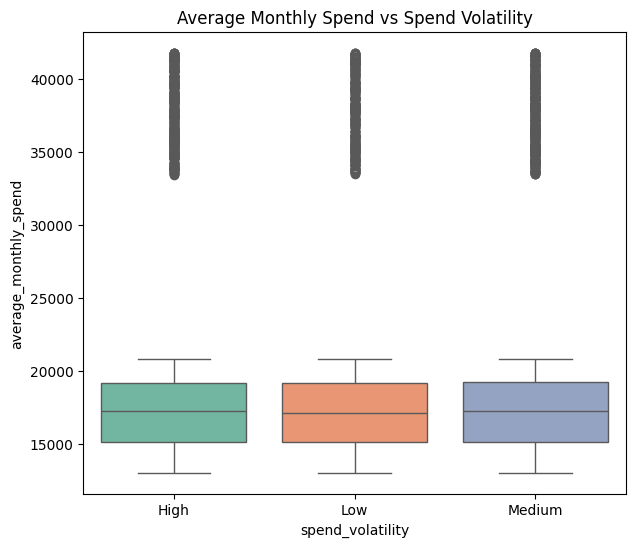

/tmp/ipykernel_1013/4227112306.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='gender', y='average_monthly_spend', palette='Set2')


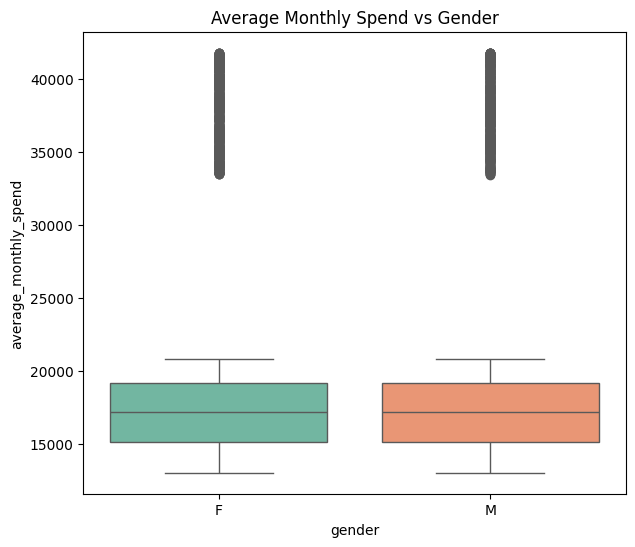

/tmp/ipykernel_1013/4227112306.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='marital_status', y='average_monthly_spend', palette='Set2')


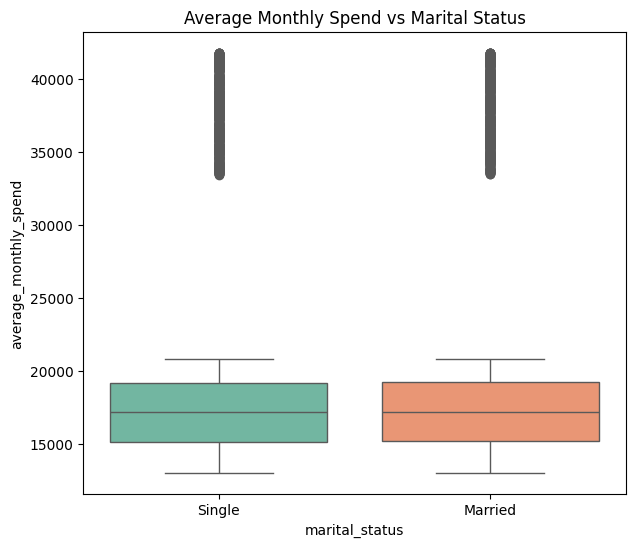

/tmp/ipykernel_1013/4227112306.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='inactivity_flag', y='average_monthly_spend', palette='Set2')


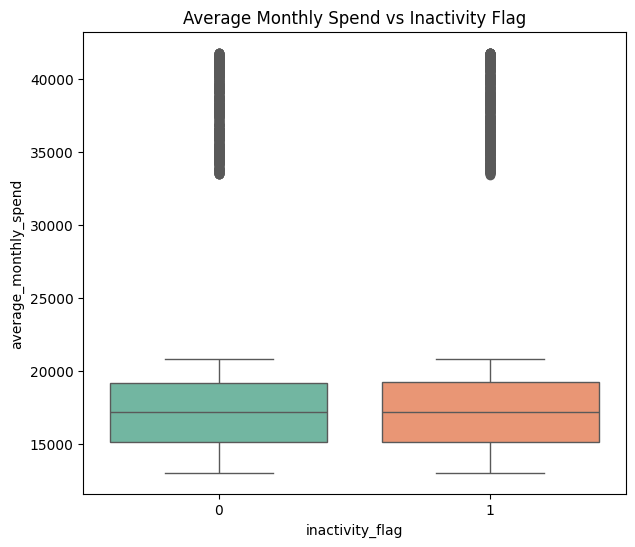

In [35]:
# ---- Graph 1a: average_monthly_spend vs spend_volatility ----
plt.figure(figsize=(7, 6))
sns.boxplot(data=df, x='spend_volatility', y='average_monthly_spend', palette='Set2')
plt.title('Average Monthly Spend vs Spend Volatility')
plt.xlabel('spend_volatility')
plt.ylabel('average_monthly_spend')
plt.show()


# ---- Graph 1b: average_monthly_spend vs gender ----
plt.figure(figsize=(7, 6))
sns.boxplot(data=df, x='gender', y='average_monthly_spend', palette='Set2')
plt.title('Average Monthly Spend vs Gender')
plt.xlabel('gender')
plt.ylabel('average_monthly_spend')
plt.show()


# ---- Graph 2a: average_monthly_spend vs marital_status ----
plt.figure(figsize=(7, 6))
sns.boxplot(data=df, x='marital_status', y='average_monthly_spend', palette='Set2')
plt.title('Average Monthly Spend vs Marital Status')
plt.xlabel('marital_status')
plt.ylabel('average_monthly_spend')
plt.show()


# ---- Graph 2b: average_monthly_spend vs inactivity_flag ----
plt.figure(figsize=(7, 6))
sns.boxplot(data=df, x='inactivity_flag', y='average_monthly_spend', palette='Set2')
plt.title('Average Monthly Spend vs Inactivity Flag')
plt.xlabel('inactivity_flag')
plt.ylabel('average_monthly_spend')
plt.show()

/tmp/ipykernel_1013/390426215.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='spend_volatility', y='average_monthly_spend', palette='Set2')


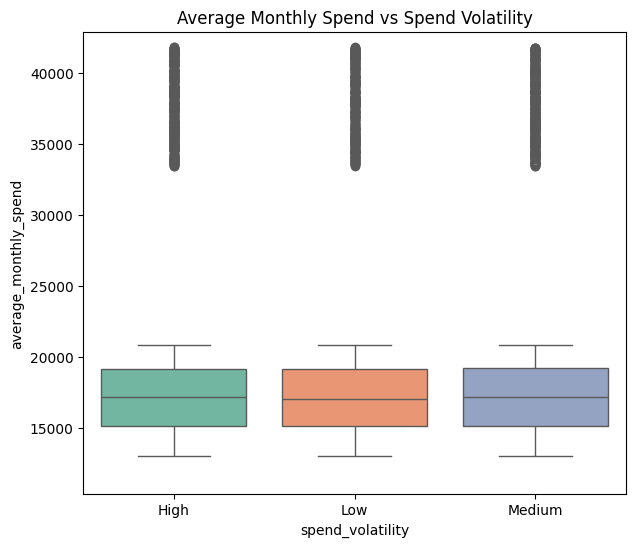

/tmp/ipykernel_1013/390426215.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='gender', y='average_monthly_spend', palette='Set2')


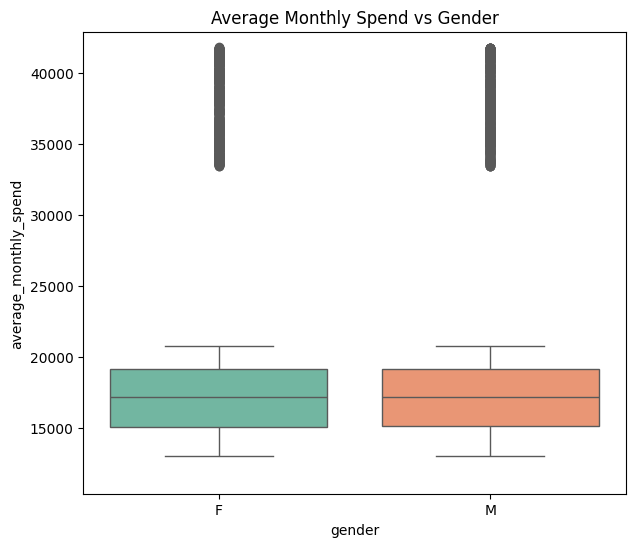

/tmp/ipykernel_1013/390426215.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='marital_status', y='average_monthly_spend', palette='Set2')


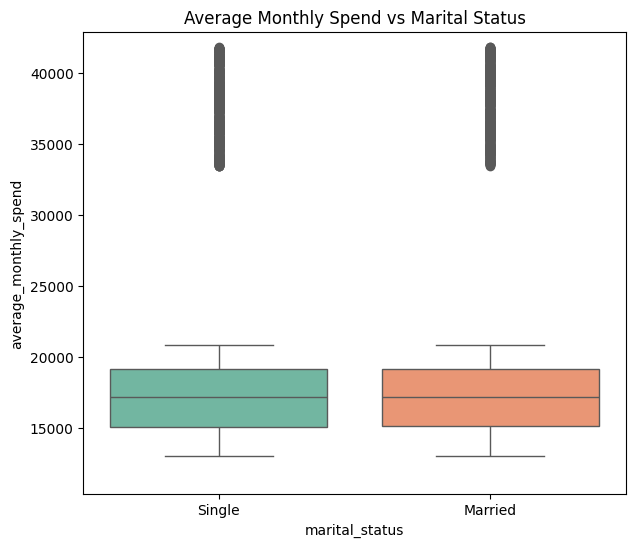

/tmp/ipykernel_1013/390426215.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='inactivity_flag', y='average_monthly_spend', palette='Set2')


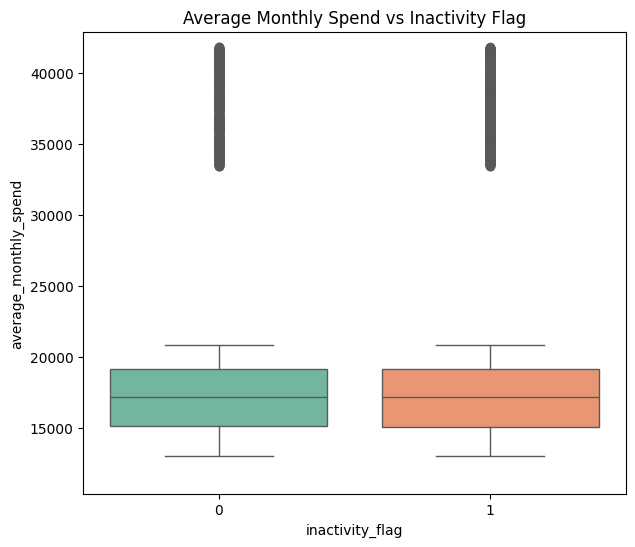

In [36]:
# Helper to get a sensible y-range (avoids being squished by extreme outliers)
def get_ylim(col, lower_pct=1, upper_pct=99, pad_pct=0.1):
    lower = df[col].quantile(lower_pct/100)
    upper = df[col].quantile(upper_pct/100)
    pad = (upper - lower) * pad_pct
    return lower - pad, upper + pad

ylim_spend = get_ylim('average_monthly_spend')

# ---- Graph 1a: average_monthly_spend vs spend_volatility ----
plt.figure(figsize=(7, 6))
sns.boxplot(data=df, x='spend_volatility', y='average_monthly_spend', palette='Set2')
plt.title('Average Monthly Spend vs Spend Volatility')
plt.xlabel('spend_volatility')
plt.ylabel('average_monthly_spend')
plt.ylim(ylim_spend)
plt.show()


# ---- Graph 1b: average_monthly_spend vs gender ----
plt.figure(figsize=(7, 6))
sns.boxplot(data=df, x='gender', y='average_monthly_spend', palette='Set2')
plt.title('Average Monthly Spend vs Gender')
plt.xlabel('gender')
plt.ylabel('average_monthly_spend')
plt.ylim(ylim_spend)
plt.show()


# ---- Graph 2a: average_monthly_spend vs marital_status ----
plt.figure(figsize=(7, 6))
sns.boxplot(data=df, x='marital_status', y='average_monthly_spend', palette='Set2')
plt.title('Average Monthly Spend vs Marital Status')
plt.xlabel('marital_status')
plt.ylabel('average_monthly_spend')
plt.ylim(ylim_spend)
plt.show()


# ---- Graph 2b: average_monthly_spend vs inactivity_flag ----
plt.figure(figsize=(7, 6))
sns.boxplot(data=df, x='inactivity_flag', y='average_monthly_spend', palette='Set2')
plt.title('Average Monthly Spend vs Inactivity Flag')
plt.xlabel('inactivity_flag')
plt.ylabel('average_monthly_spend')
plt.ylim(ylim_spend)
plt.show()

/tmp/ipykernel_1013/3815561257.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='spend_volatility', y='average_monthly_spend', palette='Set2')


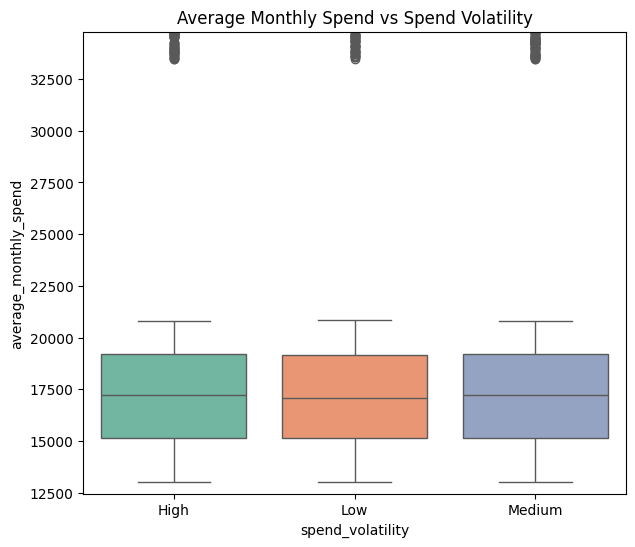

/tmp/ipykernel_1013/3815561257.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='gender', y='average_monthly_spend', palette='Set2')


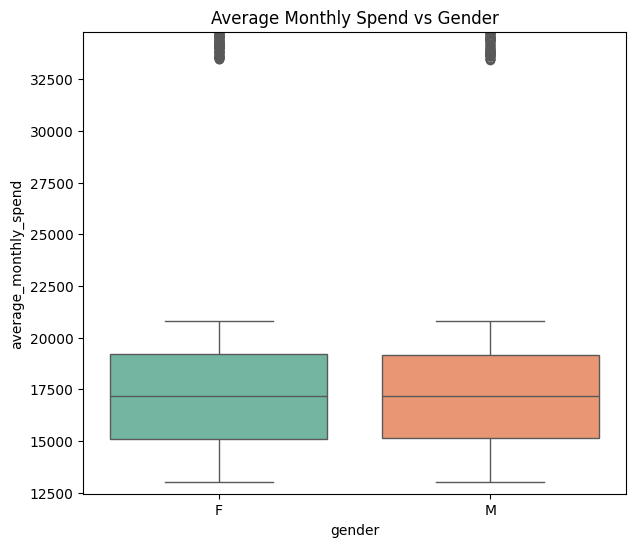

/tmp/ipykernel_1013/3815561257.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='marital_status', y='average_monthly_spend', palette='Set2')


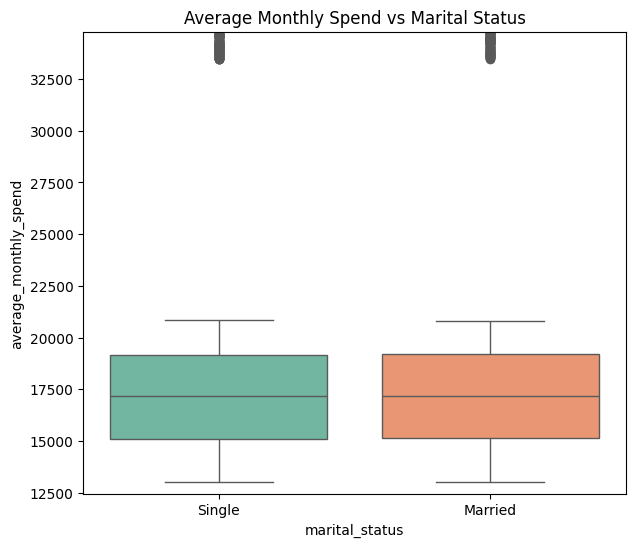

/tmp/ipykernel_1013/3815561257.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='inactivity_flag', y='average_monthly_spend', palette='Set2')


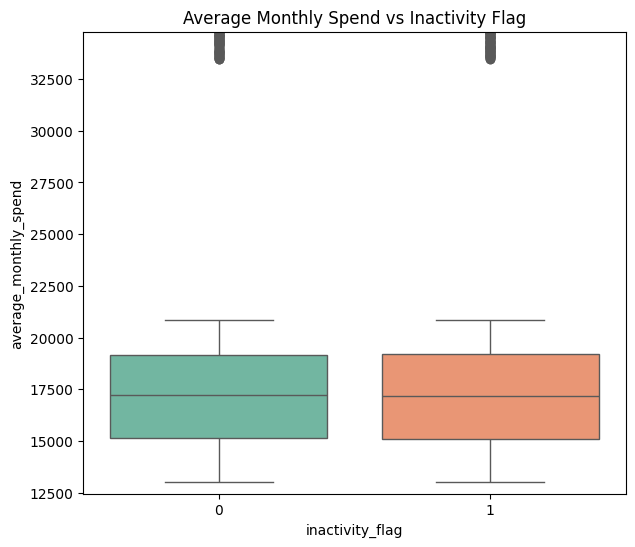

In [37]:
# Helper to get a tighter y-range (ok to clip a few outliers for a stretched look)
def get_ylim(col, lower_pct=5, upper_pct=95, pad_pct=0.05):
    lower = df[col].quantile(lower_pct/100)
    upper = df[col].quantile(upper_pct/100)
    pad = (upper - lower) * pad_pct
    return lower - pad, upper + pad

ylim_spend = get_ylim('average_monthly_spend')

# ---- Graph 1a: average_monthly_spend vs spend_volatility ----
plt.figure(figsize=(7, 6))
sns.boxplot(data=df, x='spend_volatility', y='average_monthly_spend', palette='Set2')
plt.title('Average Monthly Spend vs Spend Volatility')
plt.xlabel('spend_volatility')
plt.ylabel('average_monthly_spend')
plt.ylim(ylim_spend)
plt.show()


# ---- Graph 1b: average_monthly_spend vs gender ----
plt.figure(figsize=(7, 6))
sns.boxplot(data=df, x='gender', y='average_monthly_spend', palette='Set2')
plt.title('Average Monthly Spend vs Gender')
plt.xlabel('gender')
plt.ylabel('average_monthly_spend')
plt.ylim(ylim_spend)
plt.show()


# ---- Graph 2a: average_monthly_spend vs marital_status ----
plt.figure(figsize=(7, 6))
sns.boxplot(data=df, x='marital_status', y='average_monthly_spend', palette='Set2')
plt.title('Average Monthly Spend vs Marital Status')
plt.xlabel('marital_status')
plt.ylabel('average_monthly_spend')
plt.ylim(ylim_spend)
plt.show()


# ---- Graph 2b: average_monthly_spend vs inactivity_flag ----
plt.figure(figsize=(7, 6))
sns.boxplot(data=df, x='inactivity_flag', y='average_monthly_spend', palette='Set2')
plt.title('Average Monthly Spend vs Inactivity Flag')
plt.xlabel('inactivity_flag')
plt.ylabel('average_monthly_spend')
plt.ylim(ylim_spend)
plt.show()

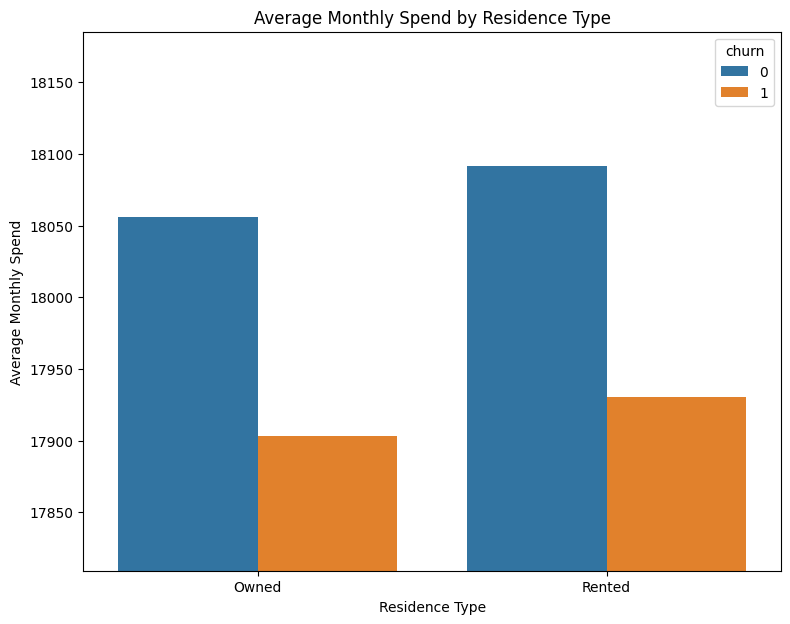

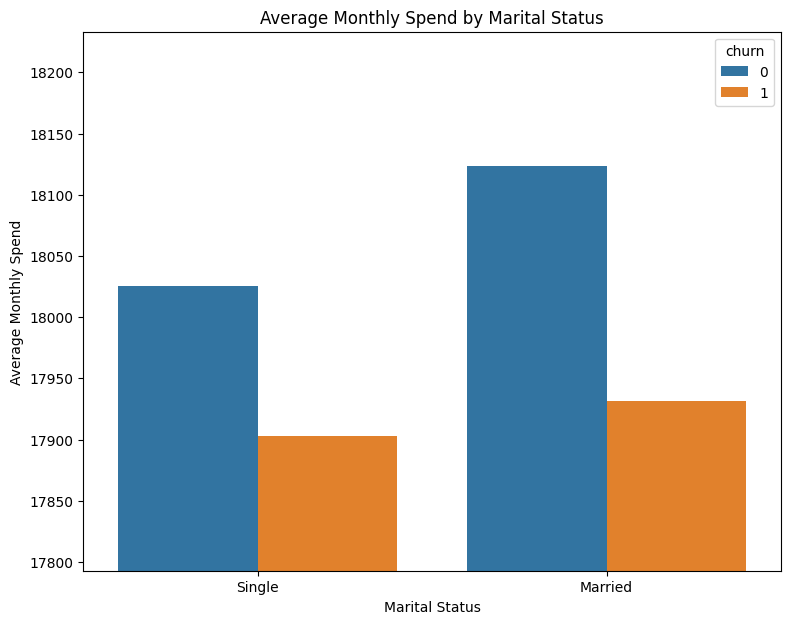

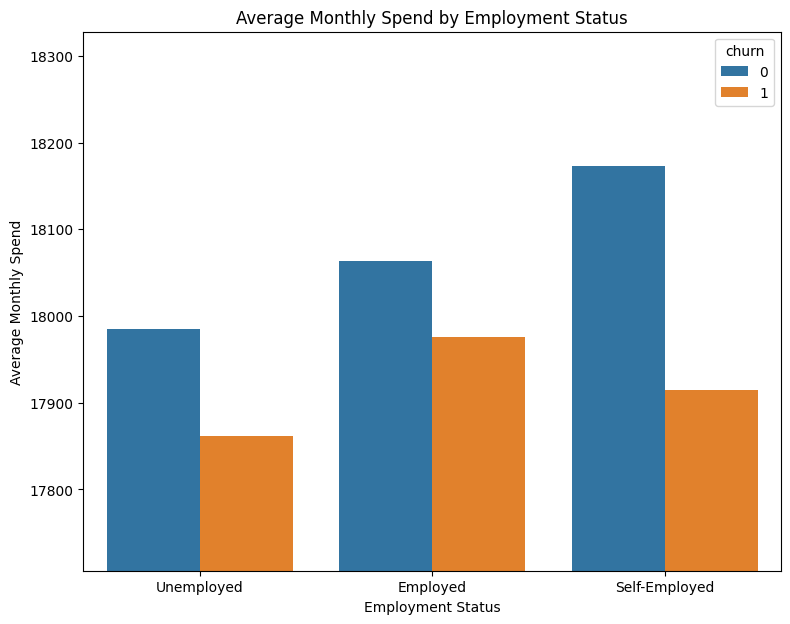

In [38]:
# Helper to zoom into where the bars actually sit
def get_bar_ylim(df, group_col, value_col, hue_col='churn', pad_pct=0.5):
    means = df.groupby([group_col, hue_col])[value_col].mean()
    lower = means.min()
    upper = means.max()
    pad = (upper - lower) * pad_pct if upper != lower else upper * 0.05
    return max(0, lower - pad), upper + pad


# ---- Average Monthly Spend by Residence Type (split by churn) ----
ylim = get_bar_ylim(df, 'residence_type', 'average_monthly_spend')
plt.figure(figsize=(9, 7))
sns.barplot(data=df, x='residence_type', y='average_monthly_spend', hue='churn', errorbar=None)
plt.title('Average Monthly Spend by Residence Type')
plt.xlabel('Residence Type')
plt.ylabel('Average Monthly Spend')
plt.ylim(ylim)
plt.legend(title='churn')
plt.show()


# ---- Average Monthly Spend by Marital Status (split by churn) ----
ylim = get_bar_ylim(df, 'marital_status', 'average_monthly_spend')
plt.figure(figsize=(9, 7))
sns.barplot(data=df, x='marital_status', y='average_monthly_spend', hue='churn', errorbar=None)
plt.title('Average Monthly Spend by Marital Status')
plt.xlabel('Marital Status')
plt.ylabel('Average Monthly Spend')
plt.ylim(ylim)
plt.legend(title='churn')
plt.show()


# ---- Average Monthly Spend by Employment Status (split by churn) ----
ylim = get_bar_ylim(df, 'employment_status', 'average_monthly_spend')
plt.figure(figsize=(9, 7))
sns.barplot(data=df, x='employment_status', y='average_monthly_spend', hue='churn', errorbar=None)
plt.title('Average Monthly Spend by Employment Status')
plt.xlabel('Employment Status')
plt.ylabel('Average Monthly Spend')
plt.ylim(ylim)
plt.legend(title='churn')
plt.show()

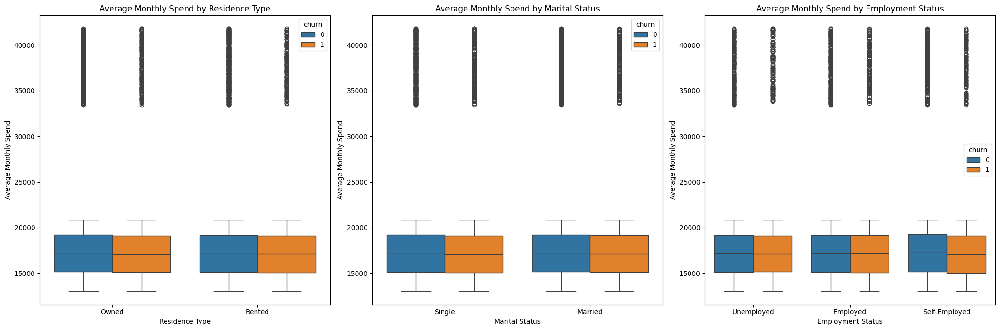

In [39]:
fig, axes = plt.subplots(1, 3, figsize=(21, 7))

sns.boxplot(data=df, x='residence_type', y='average_monthly_spend', hue='churn', ax=axes[0])
axes[0].set_title('Average Monthly Spend by Residence Type')
axes[0].set_xlabel('Residence Type')
axes[0].set_ylabel('Average Monthly Spend')

sns.boxplot(data=df, x='marital_status', y='average_monthly_spend', hue='churn', ax=axes[1])
axes[1].set_title('Average Monthly Spend by Marital Status')
axes[1].set_xlabel('Marital Status')
axes[1].set_ylabel('Average Monthly Spend')

sns.boxplot(data=df, x='employment_status', y='average_monthly_spend', hue='churn', ax=axes[2])
axes[2].set_title('Average Monthly Spend by Employment Status')
axes[2].set_xlabel('Employment Status')
axes[2].set_ylabel('Average Monthly Spend')

plt.tight_layout()
plt.show()

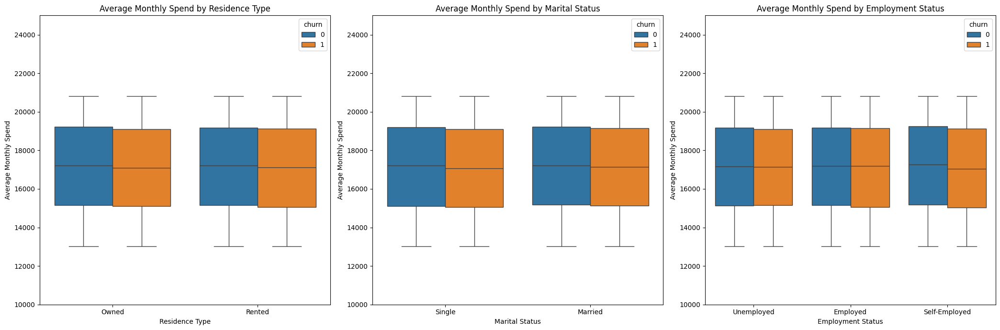

In [40]:
fig, axes = plt.subplots(1, 3, figsize=(21, 7))

sns.boxplot(data=df, x='residence_type', y='average_monthly_spend', hue='churn', ax=axes[0])
axes[0].set_title('Average Monthly Spend by Residence Type')
axes[0].set_xlabel('Residence Type')
axes[0].set_ylabel('Average Monthly Spend')
axes[0].set_ylim(10000, 25000)

sns.boxplot(data=df, x='marital_status', y='average_monthly_spend', hue='churn', ax=axes[1])
axes[1].set_title('Average Monthly Spend by Marital Status')
axes[1].set_xlabel('Marital Status')
axes[1].set_ylabel('Average Monthly Spend')
axes[1].set_ylim(10000, 25000)

sns.boxplot(data=df, x='employment_status', y='average_monthly_spend', hue='churn', ax=axes[2])
axes[2].set_title('Average Monthly Spend by Employment Status')
axes[2].set_xlabel('Employment Status')
axes[2].set_ylabel('Average Monthly Spend')
axes[2].set_ylim(10000, 25000)

plt.tight_layout()
plt.show()

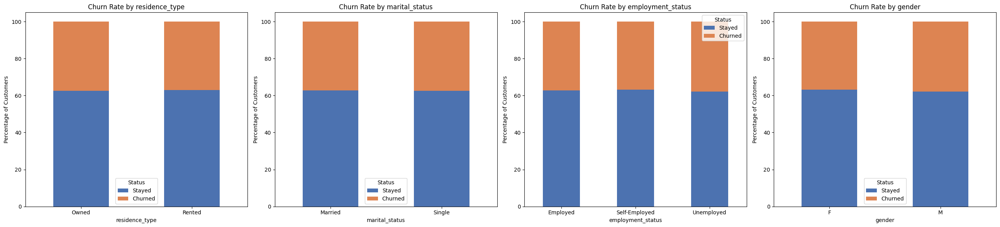

In [41]:
def stacked_churn_pct(df, group_col, ax):
    # Get % churned vs not per category
    pct = pd.crosstab(df[group_col], df['churn'], normalize='index') * 100
    pct = pct.rename(columns={0: 'Stayed', 1: 'Churned'})

    pct.plot(kind='bar', stacked=True, ax=ax, color=['#4C72B0', '#DD8452'])
    ax.set_title(f'Churn Rate by {group_col}')
    ax.set_xlabel(group_col)
    ax.set_ylabel('Percentage of Customers')
    ax.legend(title='Status')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0)


fig, axes = plt.subplots(1, 4, figsize=(26, 6))

stacked_churn_pct(df, 'residence_type', axes[0])
stacked_churn_pct(df, 'marital_status', axes[1])
stacked_churn_pct(df, 'employment_status', axes[2])
stacked_churn_pct(df, 'gender', axes[3])

plt.tight_layout()
plt.show()

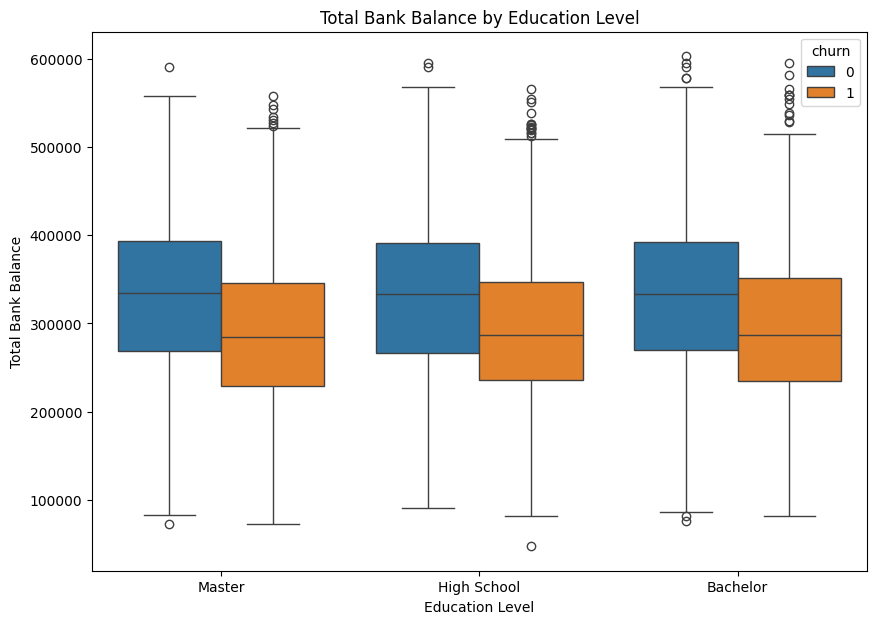

In [42]:
plt.figure(figsize=(10, 7))
sns.boxplot(data=df, x='education_level', y='total_bank_balance', hue='churn')
plt.title('Total Bank Balance by Education Level')
plt.xlabel('Education Level')
plt.ylabel('Total Bank Balance')
plt.legend(title='churn')
plt.show()

/tmp/ipykernel_1013/3982554714.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='education_level', y='total_bank_balance', palette='Set2')


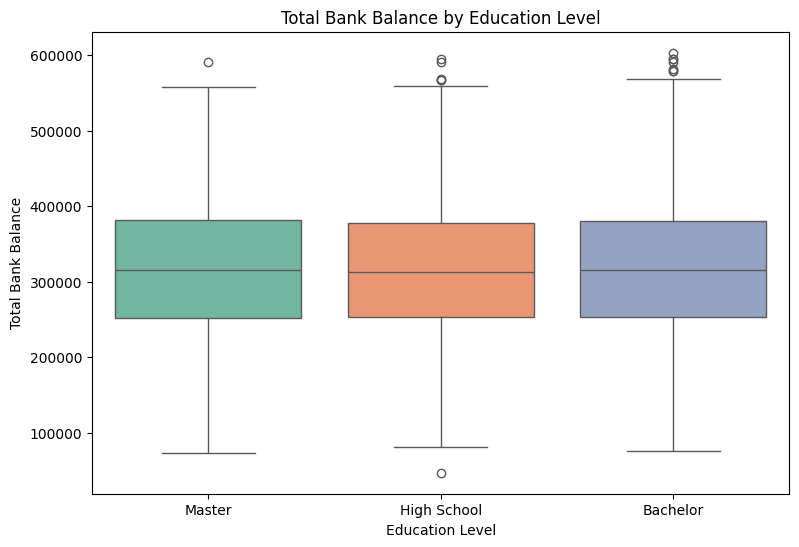

In [43]:
plt.figure(figsize=(9, 6))
sns.boxplot(data=df, x='education_level', y='total_bank_balance', palette='Set2')
plt.title('Total Bank Balance by Education Level')
plt.xlabel('Education Level')
plt.ylabel('Total Bank Balance')
plt.show()

/tmp/ipykernel_1013/334612673.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='account_types', y='total_bank_balance', palette='Set2')


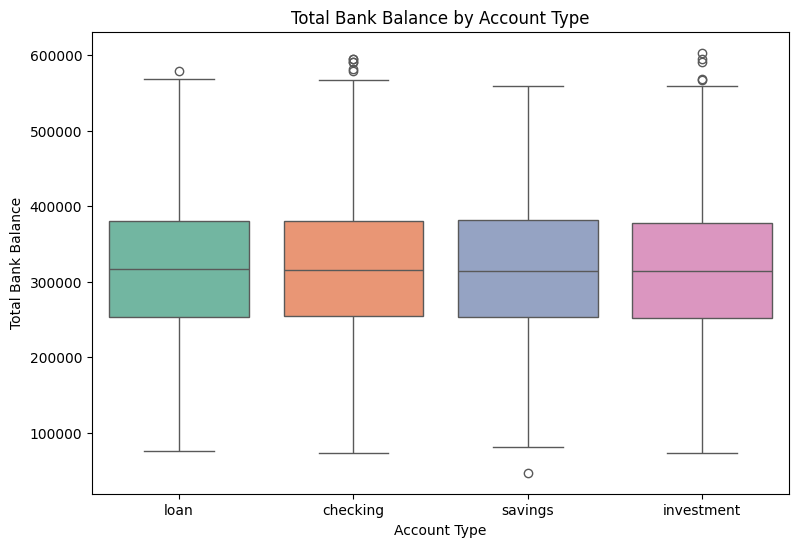

In [44]:
plt.figure(figsize=(9, 6))
sns.boxplot(data=df, x='account_types', y='total_bank_balance', palette='Set2')
plt.title('Total Bank Balance by Account Type')
plt.xlabel('Account Type')
plt.ylabel('Total Bank Balance')
plt.show()

#Preprocessing

In [45]:
(df.isnull().sum() / df.shape[0])*100

,0
index,0.000
monthly_spend_cash,10.075
monthly_spend_payments,9.850
monthly_spend_installments,7.590
monthly_spend_subscriptions,0.000
monthly_spend_travel,0.000
monthly_spend_dining,0.000
monthly_spend_shopping,0.000
total_spend_last_month,0.000
total_spend_last_3_months,0.000


In [46]:
# ---- Cell 1: Set aside the ID columns before dropping (keep them safe for later) ----
id_like_cols = ['acc_ref_num', 'act_ref_num', 'cust_id']

id_lookup = df[id_like_cols].copy()   # saved separately, same index as df
df = df.drop(columns=id_like_cols)

print("IDs saved:", id_lookup.shape)
print("df shape after dropping:", df.shape)

IDs saved: (20000, 3)
df shape after dropping: (20000, 57)


In [47]:
cols_to_impute = [
    'monthly_spend_cash',
    'monthly_spend_payments',
    'monthly_spend_installments',
    'average_transaction_value',
    'feature_3',
    'loyalty_score',
    'total_bank_balance'
]

print(cols_to_impute)

['monthly_spend_cash', 'monthly_spend_payments', 'monthly_spend_installments', 'average_transaction_value', 'feature_3', 'loyalty_score', 'total_bank_balance']


In [48]:
numeric_cols = df.select_dtypes(include='number').columns.tolist()
print(numeric_cols)

['index', 'monthly_spend_cash', 'monthly_spend_payments', 'monthly_spend_installments', 'monthly_spend_subscriptions', 'monthly_spend_travel', 'monthly_spend_dining', 'monthly_spend_shopping', 'total_spend_last_month', 'total_spend_last_3_months', 'total_spend_last_6_months', 'total_spend_last_year', 'average_monthly_spend', 'max_monthly_spend', 'min_monthly_spend', 'average_transaction_value', 'num_transactions_last_month', 'num_transactions_last_3_months', 'num_transactions_last_6_months', 'num_transactions_last_year', 'average_monthly_transactions', 'max_monthly_transactions', 'min_monthly_transactions', 'decreasing_spend_trend', 'recent_large_transactions', 'use_of_credit_card_for_emergencies', 'frequent_late_payments', 'churn', 'previous_cards', 'longevity_in_months', 'feature_1', 'feature_2', 'feature_3', 'credit_limit', 'credit_limit_utilization', 'average_payment_delay', 'monthly_active_days', 'num_other_products', 'loyalty_score', 'transaction_frequency', 'total_bank_balance',

In [49]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import HistGradientBoostingRegressor

mice_imputer = IterativeImputer(
    estimator=HistGradientBoostingRegressor(random_state=42),
    max_iter=10,
    random_state=42,
    initial_strategy='mean',
    verbose=0
)

# Actually run the imputation
imputed_array = mice_imputer.fit_transform(df[numeric_cols])
imputed_df = pd.DataFrame(imputed_array, columns=numeric_cols, index=df.index)
df[cols_to_impute] = imputed_df[cols_to_impute]

print(df[cols_to_impute].isnull().sum())

monthly_spend_cash            0
monthly_spend_payments        0
monthly_spend_installments    0
average_transaction_value     0
feature_3                     0
loyalty_score                 0
total_bank_balance            0
dtype: int64


/usr/local/lib/python3.13/dist-packages/sklearn/impute/_iterative.py:895: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [50]:
print("education_level:", df['education_level'].unique())
print("spend_volatility:", df['spend_volatility'].unique())

education_level: ['Master' 'High School' 'Bachelor']
spend_volatility: ['High' 'Low' 'Medium']


In [51]:
education_order = {
    'High School': 0,
    'Bachelor': 1,
    'Master': 2,
    'PhD': 3
}

volatility_order = {
    'Low': 0,
    'Medium': 1,
    'High': 2
}

df['education_level'] = df['education_level'].map(education_order)
df['spend_volatility'] = df['spend_volatility'].map(volatility_order)

print(df[['education_level', 'spend_volatility']].isnull().sum())

education_level     0
spend_volatility    0
dtype: int64


In [52]:
df[['education_level', 'spend_volatility']].head()

,education_level,spend_volatility
0,2,2
1,2,0
2,2,2
3,2,2
4,2,2


In [53]:
nominal_cols = ['gender', 'marital_status', 'residence_type', 'account_types', 'employment_status']

# Get the dummy column names before creating them, so we can target only those
df = pd.get_dummies(df, columns=nominal_cols, drop_first=True)

# Find the newly created dummy columns (they're bool dtype) and convert only those to 0/1 int
dummy_cols = df.select_dtypes(include='bool').columns
df[dummy_cols] = df[dummy_cols].astype(int)

print(df.shape)
df.head()

(20000, 60)


,index,monthly_spend_cash,monthly_spend_payments,monthly_spend_installments,monthly_spend_subscriptions,monthly_spend_travel,monthly_spend_dining,monthly_spend_shopping,total_spend_last_month,total_spend_last_3_months,...,inactivity_flag,month_key,gender_M,marital_status_Single,residence_type_Rented,account_types_investment,account_types_loan,account_types_savings,employment_status_Self-Employed,employment_status_Unemployed
0,5464,4664.000000,7438.0,15398.000000,760,4884.056742,2211,6555.000000,40001,134147.488984,...,1,2023-01,0,1,0,0,1,0,0,1
1,2042,3005.576521,8252.0,18864.429771,665,2970.000000,920,6430.319172,32342,101638.757719,...,1,2023-01,0,0,0,0,0,0,0,1
2,8669,1408.000000,5199.0,4964.000000,882,1167.000000,2418,4967.000000,21005,52898.328993,...,0,2023-01,0,1,0,0,0,0,0,0
3,1115,2744.392044,1837.0,18270.000000,722,4808.275207,43,5992.000000,30275,86390.416083,...,1,2023-01,0,0,1,0,1,0,1,0
4,4078,4134.000000,7530.0,18272.775610,166,3256.000000,2736,7506.437574,23050,74438.420532,...,0,2023-01,1,0,1,0,0,0,0,0


In [54]:
df.head()

,index,monthly_spend_cash,monthly_spend_payments,monthly_spend_installments,monthly_spend_subscriptions,monthly_spend_travel,monthly_spend_dining,monthly_spend_shopping,total_spend_last_month,total_spend_last_3_months,...,inactivity_flag,month_key,gender_M,marital_status_Single,residence_type_Rented,account_types_investment,account_types_loan,account_types_savings,employment_status_Self-Employed,employment_status_Unemployed
0,5464,4664.000000,7438.0,15398.000000,760,4884.056742,2211,6555.000000,40001,134147.488984,...,1,2023-01,0,1,0,0,1,0,0,1
1,2042,3005.576521,8252.0,18864.429771,665,2970.000000,920,6430.319172,32342,101638.757719,...,1,2023-01,0,0,0,0,0,0,0,1
2,8669,1408.000000,5199.0,4964.000000,882,1167.000000,2418,4967.000000,21005,52898.328993,...,0,2023-01,0,1,0,0,0,0,0,0
3,1115,2744.392044,1837.0,18270.000000,722,4808.275207,43,5992.000000,30275,86390.416083,...,1,2023-01,0,0,1,0,1,0,1,0
4,4078,4134.000000,7530.0,18272.775610,166,3256.000000,2736,7506.437574,23050,74438.420532,...,0,2023-01,1,0,1,0,0,0,0,0


In [55]:
df.shape

(20000, 60)

In [56]:
# ---- Rejoin the ID columns back into df ----
df = df.join(id_lookup)

print(df.shape)
df.head()

(20000, 63)


,index,monthly_spend_cash,monthly_spend_payments,monthly_spend_installments,monthly_spend_subscriptions,monthly_spend_travel,monthly_spend_dining,monthly_spend_shopping,total_spend_last_month,total_spend_last_3_months,...,marital_status_Single,residence_type_Rented,account_types_investment,account_types_loan,account_types_savings,employment_status_Self-Employed,employment_status_Unemployed,acc_ref_num,act_ref_num,cust_id
0,5464,4664.000000,7438.0,15398.000000,760,4884.056742,2211,6555.000000,40001,134147.488984,...,1,0,0,1,0,0,1,952043535551,ACC_00000001,CUST_005533
1,2042,3005.576521,8252.0,18864.429771,665,2970.000000,920,6430.319172,32342,101638.757719,...,0,0,0,0,0,0,1,878089652769,ACC_00000002,CUST_008661
2,8669,1408.000000,5199.0,4964.000000,882,1167.000000,2418,4967.000000,21005,52898.328993,...,1,0,0,0,0,0,0,653733701091,ACC_00000003,CUST_000841
3,1115,2744.392044,1837.0,18270.000000,722,4808.275207,43,5992.000000,30275,86390.416083,...,0,1,0,1,0,1,0,215639822409,ACC_00000004,CUST_003450
4,4078,4134.000000,7530.0,18272.775610,166,3256.000000,2736,7506.437574,23050,74438.420532,...,0,1,0,0,0,0,0,350623699852,ACC_00000005,CUST_005087


In [57]:
# ---- Feature 1: cat_sum — sum of all spend category columns ----
spend_category_cols = [
    'monthly_spend_cash',
    'monthly_spend_payments',
    'monthly_spend_installments',
    'monthly_spend_subscriptions',
    'monthly_spend_travel',
    'monthly_spend_dining',
    'monthly_spend_shopping'
]

df['cat_sum'] = df[spend_category_cols].sum(axis=1)

print(df['cat_sum'].describe())

count    20000.000000
mean     29586.369383
std       7964.379568
min       5913.000000
25%      23674.000000
50%      30345.000000
75%      35912.784566
max      48368.304783
Name: cat_sum, dtype: float64


In [58]:
# ---- Feature 2: age_tier — bucket age into life-stage groups ----
df['age_tier'] = pd.cut(
    df['age'],
    bins=[0, 12, 19, 35, 50, 65, 150],
    labels=['Child', 'Teen', 'Young Adult', 'Adult', 'Middle Age', 'Senior'],
    right=True
)

print(df['age_tier'].value_counts())

age_tier
Adult          7055
Young Adult    6665
Middle Age     6280
Child             0
Teen              0
Senior            0
Name: count, dtype: int64


In [59]:
# ---- Feature 3: is_expiring_this_year — from expiration_date ----
df['expiration_date'] = pd.to_datetime(df['expiration_date'])

current_year = pd.Timestamp.now().year
df['is_expiring_this_year'] = (df['expiration_date'].dt.year == current_year).astype(int)

print(df['is_expiring_this_year'].value_counts())
print("Current year used for comparison:", current_year)

is_expiring_this_year
0    15934
1     4066
Name: count, dtype: int64
Current year used for comparison: 2026


#Scaling

In [60]:
from sklearn.preprocessing import StandardScaler, RobustScaler

# ---- Normal-looking numeric columns → StandardScaler ----
normal_looking_cols = [
    'monthly_spend_cash',
    'monthly_spend_payments',
    'monthly_spend_subscriptions',
    'monthly_spend_dining',
    'total_spend_last_month',
    'total_spend_last_3_months',
    'total_spend_last_6_months',
    'total_spend_last_year',
    'max_monthly_spend',
    'min_monthly_spend',
    'average_transaction_value',
    'num_transactions_last_month',
    'num_transactions_last_3_months',
    'num_transactions_last_6_months',
    'num_transactions_last_year',
    'max_monthly_transactions',
    'min_monthly_transactions',
    'previous_cards',
    'feature_1',
    'feature_2',
    'feature_3',
    'credit_limit',
    'credit_limit_utilization',
    'monthly_active_days',
    'loyalty_score',
    'transaction_frequency',
    'total_bank_balance',
    'age',
    'num_dependents',
    'years_at_residence',
    'months_since_last_txn',
    'utilization_ratio'
]

# ---- Skewed/outlier-heavy numeric columns → RobustScaler ----
skewed_looking_cols = [
    'monthly_spend_installments',
    'monthly_spend_travel',
    'monthly_spend_shopping',
    'average_monthly_spend',
    'average_monthly_transactions',
    'frequent_late_payments',
    'longevity_in_months',
    'average_payment_delay',
    'num_other_products'
]

# Only keep columns that actually exist in df (in case any were dropped earlier)
normal_looking_cols = [c for c in normal_looking_cols if c in df.columns]
skewed_looking_cols = [c for c in skewed_looking_cols if c in df.columns]

standard_scaler = StandardScaler()
df[normal_looking_cols] = standard_scaler.fit_transform(df[normal_looking_cols])

robust_scaler = RobustScaler()
df[skewed_looking_cols] = robust_scaler.fit_transform(df[skewed_looking_cols])

print("Scaling applied.")
print(df[normal_looking_cols + skewed_looking_cols].describe())

Scaling applied.
       monthly_spend_cash  monthly_spend_payments  \
count        2.000000e+04            2.000000e+04   
mean        -9.947598e-18            2.145839e-16   
std          1.000025e+00            1.000025e+00   
min         -1.801483e+00           -1.793193e+00   
25%         -8.163272e-01           -8.367209e-01   
50%          1.780139e-03           -4.944250e-03   
75%          8.341651e-01            8.665083e-01   
max          1.767207e+00            1.748943e+00   

       monthly_spend_subscriptions  monthly_spend_dining  \
count                 2.000000e+04          2.000000e+04   
mean                  5.471179e-17          9.237056e-17   
std                   1.000025e+00          1.000025e+00   
min                  -1.726874e+00         -1.713884e+00   
25%                  -8.781163e-01         -8.775589e-01   
50%                   8.748436e-03         -2.066910e-03   
75%                   8.609700e-01          8.653613e-01   
max                   1.7

In [61]:
print(df['frequent_late_payments'].unique())

[ 3.   0.5  0.  -1.   2.5 -0.5  3.5  4. ]


In [62]:
df.head()

,index,monthly_spend_cash,monthly_spend_payments,monthly_spend_installments,monthly_spend_subscriptions,monthly_spend_travel,monthly_spend_dining,monthly_spend_shopping,total_spend_last_month,total_spend_last_3_months,...,account_types_loan,account_types_savings,employment_status_Self-Employed,employment_status_Unemployed,acc_ref_num,act_ref_num,cust_id,cat_sum,age_tier,is_expiring_this_year
0,5464,1.528057,0.841711,0.161387,0.906006,0.583416,0.833106,0.252805,0.505999,2.398558,...,1,0,0,1,952043535551,ACC_00000001,CUST_005533,41910.056742,Adult,0
1,2042,0.344141,1.130070,0.489694,0.576896,-0.124221,-0.654078,0.223633,0.116649,1.000139,...,0,0,0,1,878089652769,ACC_00000002,CUST_008661,41107.325464,Young Adult,0
2,8669,-0.796339,0.048547,-0.826822,1.328653,-0.790800,1.071563,-0.118740,-0.459675,-1.096515,...,0,0,0,0,653733701091,ACC_00000003,CUST_000841,21005.000000,Adult,0
3,1115,0.157686,-1.142438,0.433395,0.774362,0.555399,-1.664350,0.121080,0.011571,0.344205,...,1,0,1,0,215639822409,ACC_00000004,CUST_003450,34416.667251,Middle Age,0
4,4078,1.149700,0.874302,0.433658,-1.151797,-0.018485,1.437887,0.475413,-0.355716,-0.169931,...,0,0,0,0,350623699852,ACC_00000005,CUST_005087,43601.213183,Adult,0


In [63]:
df.head()

,index,monthly_spend_cash,monthly_spend_payments,monthly_spend_installments,monthly_spend_subscriptions,monthly_spend_travel,monthly_spend_dining,monthly_spend_shopping,total_spend_last_month,total_spend_last_3_months,...,account_types_loan,account_types_savings,employment_status_Self-Employed,employment_status_Unemployed,acc_ref_num,act_ref_num,cust_id,cat_sum,age_tier,is_expiring_this_year
0,5464,1.528057,0.841711,0.161387,0.906006,0.583416,0.833106,0.252805,0.505999,2.398558,...,1,0,0,1,952043535551,ACC_00000001,CUST_005533,41910.056742,Adult,0
1,2042,0.344141,1.130070,0.489694,0.576896,-0.124221,-0.654078,0.223633,0.116649,1.000139,...,0,0,0,1,878089652769,ACC_00000002,CUST_008661,41107.325464,Young Adult,0
2,8669,-0.796339,0.048547,-0.826822,1.328653,-0.790800,1.071563,-0.118740,-0.459675,-1.096515,...,0,0,0,0,653733701091,ACC_00000003,CUST_000841,21005.000000,Adult,0
3,1115,0.157686,-1.142438,0.433395,0.774362,0.555399,-1.664350,0.121080,0.011571,0.344205,...,1,0,1,0,215639822409,ACC_00000004,CUST_003450,34416.667251,Middle Age,0
4,4078,1.149700,0.874302,0.433658,-1.151797,-0.018485,1.437887,0.475413,-0.355716,-0.169931,...,0,0,0,0,350623699852,ACC_00000005,CUST_005087,43601.213183,Adult,0


In [64]:
df = df.drop(columns=['index'], errors='ignore')
print(df.shape)

(20000, 65)


In [65]:
df = df.drop(columns=['acc_ref_num'], errors='ignore')
print(df.shape)

(20000, 64)


In [66]:
df = df.drop(columns=['month_key'], errors='ignore')
print(df.shape)

(20000, 63)


In [67]:
df = df.drop(columns=['feature_1'], errors='ignore')
print(df.shape)

(20000, 62)


In [68]:
df = df.drop(columns=['feature_2'], errors='ignore')
print(df.shape)

(20000, 61)


In [69]:
df = df.drop(columns=['feature_3'], errors='ignore')
print(df.shape)

(20000, 60)


In [70]:
df = df.drop(columns=['plastic_masked_pan'], errors='ignore')
print(df.shape)

(20000, 59)


In [71]:
df = df.drop(columns=['expiration_date'])

#Feature Engineering

In [72]:
# ---- Ordinal encode age_tier ----
age_tier_order = {
    'Child': 0,
    'Teen': 1,
    'Young Adult': 2,
    'Adult': 3,
    'Middle Age': 4,
    'Senior': 5
}

df['age_tier'] = df['age_tier'].map(age_tier_order)

print(df['age_tier'].isnull().sum())  # should be 0
df['age_tier'].value_counts()

0


,count
age_tier,
3,7055
2,6665
4,6280
0,0
1,0
5,0


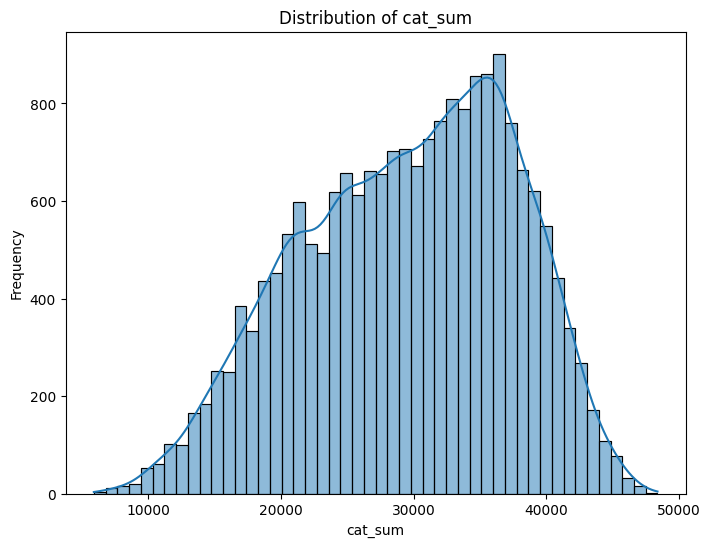

Skewness of cat_sum: -0.28630421240616083


In [73]:
# ---- Check cat_sum distribution ----
plt.figure(figsize=(8, 6))
sns.histplot(data=df, x='cat_sum', kde=True)
plt.title('Distribution of cat_sum')
plt.xlabel('cat_sum')
plt.ylabel('Frequency')
plt.show()

print("Skewness of cat_sum:", df['cat_sum'].skew())

In [74]:
# ---- Standardize cat_sum ----
from sklearn.preprocessing import StandardScaler

standard_scaler_catsum = StandardScaler()
df['cat_sum'] = standard_scaler_catsum.fit_transform(df[['cat_sum']])

print(df['cat_sum'].describe())

count    2.000000e+04
mean     5.400125e-17
std      1.000025e+00
min     -2.972480e+00
25%     -7.423701e-01
50%      9.525533e-02
75%      7.943586e-01
max      2.358301e+00
Name: cat_sum, dtype: float64


In [75]:
df.head()

,monthly_spend_cash,monthly_spend_payments,monthly_spend_installments,monthly_spend_subscriptions,monthly_spend_travel,monthly_spend_dining,monthly_spend_shopping,total_spend_last_month,total_spend_last_3_months,total_spend_last_6_months,...,account_types_investment,account_types_loan,account_types_savings,employment_status_Self-Employed,employment_status_Unemployed,act_ref_num,cust_id,cat_sum,age_tier,is_expiring_this_year
0,1.528057,0.841711,0.161387,0.906006,0.583416,0.833106,0.252805,0.505999,2.398558,1.625654,...,0,1,0,0,1,ACC_00000001,CUST_005533,1.547389,3,0
1,0.344141,1.130070,0.489694,0.576896,-0.124221,-0.654078,0.223633,0.116649,1.000139,0.902779,...,0,0,0,0,1,ACC_00000002,CUST_008661,1.446597,2,0
2,-0.796339,0.048547,-0.826822,1.328653,-0.790800,1.071563,-0.118740,-0.459675,-1.096515,-0.883188,...,0,0,0,0,0,ACC_00000003,CUST_000841,-1.077496,3,0
3,0.157686,-1.142438,0.433395,0.774362,0.555399,-1.664350,0.121080,0.011571,0.344205,0.718466,...,0,1,0,1,0,ACC_00000004,CUST_003450,0.606503,4,0
4,1.149700,0.874302,0.433658,-1.151797,-0.018485,1.437887,0.475413,-0.355716,-0.169931,-0.255991,...,0,0,0,0,0,ACC_00000005,CUST_005087,1.759735,3,0


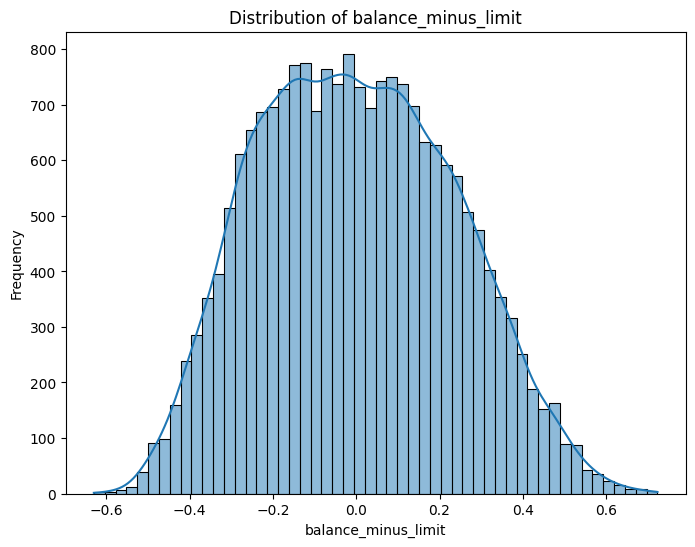

Skewness of balance_minus_limit: 0.15434222012260213
count    2.000000e+04
mean    -1.087130e-16
std      2.338982e-01
min     -6.297112e-01
25%     -1.817663e-01
50%     -9.055420e-03
75%      1.738149e-01
max      7.230545e-01
Name: balance_minus_limit, dtype: float64


In [76]:
# ---- Feature: balance_minus_limit = total_bank_balance - credit_limit ----
df['balance_minus_limit'] = df['total_bank_balance'] - df['credit_limit']

# ---- Check its distribution ----
plt.figure(figsize=(8, 6))
sns.histplot(data=df, x='balance_minus_limit', kde=True)
plt.title('Distribution of balance_minus_limit')
plt.xlabel('balance_minus_limit')
plt.ylabel('Frequency')
plt.show()

print("Skewness of balance_minus_limit:", df['balance_minus_limit'].skew())
print(df['balance_minus_limit'].describe())

In [77]:
# ---- Standardize balance_minus_limit ----
from sklearn.preprocessing import StandardScaler

standard_scaler_balance = StandardScaler()
df['balance_minus_limit'] = standard_scaler_balance.fit_transform(df[['balance_minus_limit']])

print(df['balance_minus_limit'].describe())

count    2.000000e+04
mean     8.526513e-18
std      1.000025e+00
min     -2.692312e+00
25%     -7.771363e-01
50%     -3.871618e-02
75%      7.431406e-01
max      3.091398e+00
Name: balance_minus_limit, dtype: float64


In [78]:
df.head()

,monthly_spend_cash,monthly_spend_payments,monthly_spend_installments,monthly_spend_subscriptions,monthly_spend_travel,monthly_spend_dining,monthly_spend_shopping,total_spend_last_month,total_spend_last_3_months,total_spend_last_6_months,...,account_types_loan,account_types_savings,employment_status_Self-Employed,employment_status_Unemployed,act_ref_num,cust_id,cat_sum,age_tier,is_expiring_this_year,balance_minus_limit
0,1.528057,0.841711,0.161387,0.906006,0.583416,0.833106,0.252805,0.505999,2.398558,1.625654,...,1,0,0,1,ACC_00000001,CUST_005533,1.547389,3,0,-2.024666
1,0.344141,1.130070,0.489694,0.576896,-0.124221,-0.654078,0.223633,0.116649,1.000139,0.902779,...,0,0,0,1,ACC_00000002,CUST_008661,1.446597,2,0,-0.230453
2,-0.796339,0.048547,-0.826822,1.328653,-0.790800,1.071563,-0.118740,-0.459675,-1.096515,-0.883188,...,0,0,0,0,ACC_00000003,CUST_000841,-1.077496,3,0,0.396420
3,0.157686,-1.142438,0.433395,0.774362,0.555399,-1.664350,0.121080,0.011571,0.344205,0.718466,...,1,0,1,0,ACC_00000004,CUST_003450,0.606503,4,0,-0.481789
4,1.149700,0.874302,0.433658,-1.151797,-0.018485,1.437887,0.475413,-0.355716,-0.169931,-0.255991,...,0,0,0,0,ACC_00000005,CUST_005087,1.759735,3,0,-0.223072


In [79]:
df.head(8)

,monthly_spend_cash,monthly_spend_payments,monthly_spend_installments,monthly_spend_subscriptions,monthly_spend_travel,monthly_spend_dining,monthly_spend_shopping,total_spend_last_month,total_spend_last_3_months,total_spend_last_6_months,...,account_types_loan,account_types_savings,employment_status_Self-Employed,employment_status_Unemployed,act_ref_num,cust_id,cat_sum,age_tier,is_expiring_this_year,balance_minus_limit
0,1.528057,0.841711,0.161387,0.906006,0.583416,0.833106,0.252805,0.505999,2.398558,1.625654,...,1,0,0,1,ACC_00000001,CUST_005533,1.547389,3,0,-2.024666
1,0.344141,1.130070,0.489694,0.576896,-0.124221,-0.654078,0.223633,0.116649,1.000139,0.902779,...,0,0,0,1,ACC_00000002,CUST_008661,1.446597,2,0,-0.230453
2,-0.796339,0.048547,-0.826822,1.328653,-0.790800,1.071563,-0.118740,-0.459675,-1.096515,-0.883188,...,0,0,0,0,ACC_00000003,CUST_000841,-1.077496,3,0,0.396420
3,0.157686,-1.142438,0.433395,0.774362,0.555399,-1.664350,0.121080,0.011571,0.344205,0.718466,...,1,0,1,0,ACC_00000004,CUST_003450,0.606503,4,0,-0.481789
4,1.149700,0.874302,0.433658,-1.151797,-0.018485,1.437887,0.475413,-0.355716,-0.169931,-0.255991,...,0,0,0,0,ACC_00000005,CUST_005087,1.759735,3,0,-0.223072
5,1.371717,-1.001092,0.187148,-1.248798,0.201120,1.443647,-0.739230,0.068507,1.114313,0.398355,...,0,1,0,0,ACC_00000006,CUST_004157,0.227096,2,0,1.298318
6,0.233791,-0.979129,-0.680968,-0.909295,0.071353,0.251365,-0.259356,-0.436545,-0.420166,-0.709310,...,0,0,0,0,ACC_00000007,CUST_000933,-1.020365,2,0,0.327771
7,0.122426,-0.860810,-0.233935,-0.614828,0.433434,-1.414374,-0.561646,-0.439646,-0.348747,-0.829159,...,1,0,0,1,ACC_00000008,CUST_002833,-0.615505,2,0,0.437667


In [80]:
df = df.set_index('act_ref_num')

In [81]:
df.head()

,monthly_spend_cash,monthly_spend_payments,monthly_spend_installments,monthly_spend_subscriptions,monthly_spend_travel,monthly_spend_dining,monthly_spend_shopping,total_spend_last_month,total_spend_last_3_months,total_spend_last_6_months,...,account_types_investment,account_types_loan,account_types_savings,employment_status_Self-Employed,employment_status_Unemployed,cust_id,cat_sum,age_tier,is_expiring_this_year,balance_minus_limit
act_ref_num,,,,,,,,,,,,,,,,,,,,,
ACC_00000001,1.528057,0.841711,0.161387,0.906006,0.583416,0.833106,0.252805,0.505999,2.398558,1.625654,...,0,1,0,0,1,CUST_005533,1.547389,3,0,-2.024666
ACC_00000002,0.344141,1.130070,0.489694,0.576896,-0.124221,-0.654078,0.223633,0.116649,1.000139,0.902779,...,0,0,0,0,1,CUST_008661,1.446597,2,0,-0.230453
ACC_00000003,-0.796339,0.048547,-0.826822,1.328653,-0.790800,1.071563,-0.118740,-0.459675,-1.096515,-0.883188,...,0,0,0,0,0,CUST_000841,-1.077496,3,0,0.396420
ACC_00000004,0.157686,-1.142438,0.433395,0.774362,0.555399,-1.664350,0.121080,0.011571,0.344205,0.718466,...,0,1,0,1,0,CUST_003450,0.606503,4,0,-0.481789
ACC_00000005,1.149700,0.874302,0.433658,-1.151797,-0.018485,1.437887,0.475413,-0.355716,-0.169931,-0.255991,...,0,0,0,0,0,CUST_005087,1.759735,3,0,-0.223072


#Train Test Split

In [82]:
# ---- Train / Validation / Test split (70/15/15, stratified on churn) ----
from sklearn.model_selection import train_test_split

# cust_id is an identifier, so exclude it from the model features
id_cols = ['cust_id']

X = df.drop(columns=['churn'] + id_cols, errors='ignore')
y = df['churn']

# Step 1: Split 70% for training and 30% for validation + test
X_train, X_temp, y_train, y_temp = train_test_split(
    X,
    y,
    test_size=0.30,
    random_state=42,
    stratify=y
)

# Step 2: Split the 30% temporary set equally:
# 15% validation + 15% test
X_val, X_test, y_val, y_test = train_test_split(
    X_temp,
    y_temp,
    test_size=0.50,
    random_state=42,
    stratify=y_temp
)

print("Train:", X_train.shape)
print("Validation:", X_val.shape)
print("Test:", X_test.shape)

print(
    "Churn rate — train:", round(y_train.mean(), 4),
    " val:", round(y_val.mean(), 4),
    " test:", round(y_test.mean(), 4)
)

# Confirm act_ref_num is preserved as the index
print("\nX_test index (act_ref_num) sample:", X_test.index[:5].tolist())

Train: (14000, 56)
Validation: (3000, 56)
Test: (3000, 56)
Churn rate — train: 0.3724  val: 0.3723  test: 0.3723

X_test index (act_ref_num) sample: ['ACC_00019813', 'ACC_00012826', 'ACC_00016830', 'ACC_00017586', 'ACC_00010471']


#Modelling

In [83]:
# ---- Logistic Regression: Train the model ----
#from sklearn.linear_model import LogisticRegression

#log_reg = LogisticRegression(random_state=42, max_iter=1000)
#log_reg.fit(X_train, y_train)

#print("Model trained.")

In [84]:
# ---- Logistic Regression: Hyperparameter Tuning + Final Model ----
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
import itertools

param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga'],
    'class_weight': [None, 'balanced']
}

keys = param_grid.keys()
combinations = list(itertools.product(*param_grid.values()))

results = []
for combo in combinations:
    params = dict(zip(keys, combo))
    try:
        model = LogisticRegression(max_iter=1000, random_state=42, **params)
        model.fit(X_train, y_train)
        val_auc = roc_auc_score(y_val, model.predict_proba(X_val)[:, 1])
        results.append({**params, 'val_auc': val_auc})
    except Exception:
        continue

results_df = pd.DataFrame(results).sort_values('val_auc', ascending=False)
best_params = results_df.iloc[0]

log_reg = LogisticRegression(max_iter=1000, random_state=42,
                               C=best_params['C'], penalty=best_params['penalty'],
                               solver=best_params['solver'], class_weight=best_params['class_weight'])
log_reg.fit(X_train, y_train)

print("Best params:", dict(best_params))
print("Model trained with tuned hyperparameters.")

/usr/local/lib/python3.13/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Best params: {'C': np.float64(0.1), 'penalty': 'l1', 'solver': 'saga', 'class_weight': None, 'val_auc': np.float64(0.9628923159722931)}
Model trained with tuned hyperparameters.


In [85]:
# ---- Rank all tested hyperparameter combinations by all key metrics ----
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

full_results = []

for _, row in results_df.iterrows():
    model = LogisticRegression(
        max_iter=1000,
        random_state=42,
        C=row['C'],
        penalty=row['penalty'],
        solver=row['solver'],
        class_weight=row['class_weight']
    )
    model.fit(X_train, y_train)

    val_pred = model.predict(X_val)
    val_proba = model.predict_proba(X_val)[:, 1]

    full_results.append({
        'C': row['C'],
        'penalty': row['penalty'],
        'solver': row['solver'],
        'class_weight': row['class_weight'],
        'accuracy': accuracy_score(y_val, val_pred),
        'precision': precision_score(y_val, val_pred),
        'recall': recall_score(y_val, val_pred),
        'f1_score': f1_score(y_val, val_pred),
        'roc_auc': roc_auc_score(y_val, val_proba)
    })

full_results_df = pd.DataFrame(full_results).sort_values('roc_auc', ascending=False).reset_index(drop=True)

print(f"Total combinations ranked: {len(full_results_df)}")
full_results_df

/usr/local/lib/python3.13/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Total combinations ranked: 40


,C,penalty,solver,class_weight,accuracy,precision,recall,f1_score,roc_auc
0,0.10,l1,saga,None,0.873667,0.787383,0.905103,0.842149,0.962892
1,0.10,l1,saga,balanced,0.868667,0.756201,0.955237,0.844146,0.962786
2,1.00,l1,saga,None,0.875333,0.790916,0.904208,0.843776,0.962499
3,10.00,l1,saga,None,0.876000,0.791243,0.905998,0.844741,0.962449
4,100.00,l1,liblinear,None,0.876000,0.791243,0.905998,0.844741,0.962440
5,100.00,l1,saga,None,0.876000,0.791243,0.905998,0.844741,0.962432
6,100.00,l2,saga,None,0.876000,0.791243,0.905998,0.844741,0.962431
7,10.00,l1,liblinear,None,0.876000,0.791243,0.905998,0.844741,0.962429
8,10.00,l2,saga,None,0.876000,0.791243,0.905998,0.844741,0.962423
9,1.00,l1,liblinear,None,0.875333,0.790461,0.905103,0.843907,0.962413


In [86]:
# ---- Generate predictions on training set ----
y_train_pred = log_reg.predict(X_train)
y_train_proba = log_reg.predict_proba(X_train)[:, 1]

print("Training predictions generated.")

Training predictions generated.


In [87]:
# ---- Training Set Evaluation ----
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score
)

train_accuracy = accuracy_score(y_train, y_train_pred)
train_precision = precision_score(y_train, y_train_pred)
train_recall = recall_score(y_train, y_train_pred)
train_f1 = f1_score(y_train, y_train_pred)
train_auc = roc_auc_score(y_train, y_train_proba)

print("Training Set Performance")
print("-" * 35)
print(f"Accuracy : {train_accuracy:.4f}")
print(f"Precision: {train_precision:.4f}")
print(f"Recall   : {train_recall:.4f}")
print(f"F1-Score : {train_f1:.4f}")
print(f"ROC-AUC  : {train_auc:.4f}")

Training Set Performance
-----------------------------------
Accuracy : 0.8726
Precision: 0.7878
Recall   : 0.9002
F1-Score : 0.8403
ROC-AUC  : 0.9600


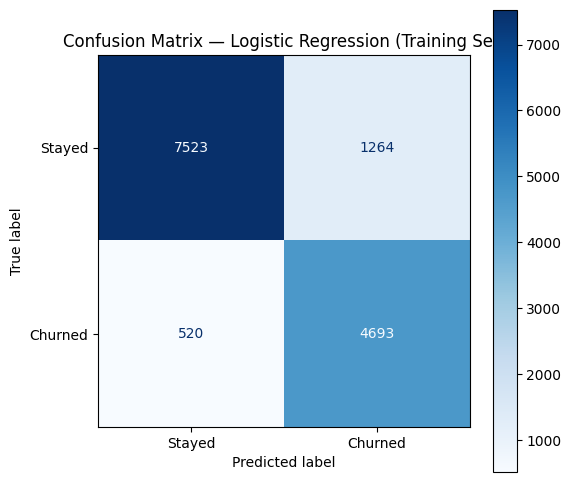

In [88]:
# ---- Confusion Matrix (Training Set) ----
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm_train = confusion_matrix(y_train, y_train_pred)

fig, ax = plt.subplots(figsize=(6, 6))
disp = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=['Stayed', 'Churned'])
disp.plot(ax=ax, cmap='Blues', values_format='d')
plt.title('Confusion Matrix — Logistic Regression (Training Set)')
plt.show()

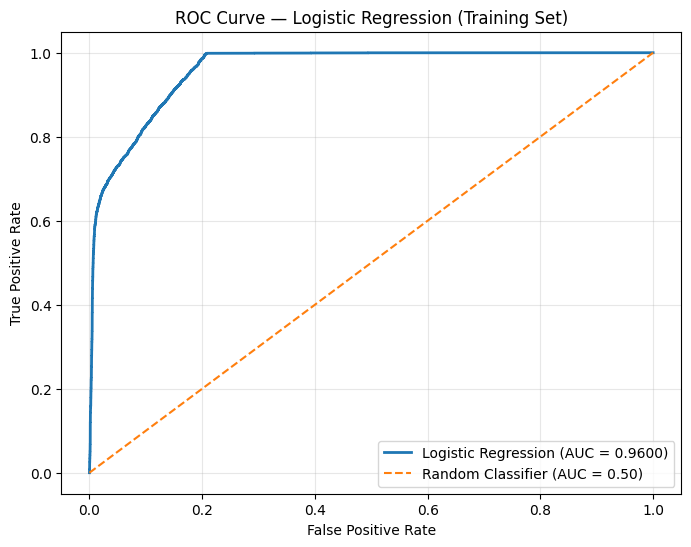

In [89]:
# ---- ROC Curve (Training Set) ----
from sklearn.metrics import roc_curve, auc

fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_proba)
roc_auc_train = auc(fpr_train, tpr_train)

plt.figure(figsize=(8, 6))

plt.plot(
    fpr_train,
    tpr_train,
    label=f'Logistic Regression (AUC = {roc_auc_train:.4f})',
    linewidth=2
)

plt.plot(
    [0, 1],
    [0, 1],
    linestyle='--',
    label='Random Classifier (AUC = 0.50)'
)

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve — Logistic Regression (Training Set)')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.show()

In [90]:
# ---- Generate predictions on validation set ----
y_val_pred = log_reg.predict(X_val)
y_val_proba = log_reg.predict_proba(X_val)[:, 1]  # probability of churn (class 1)

print("Predictions generated.")

Predictions generated.


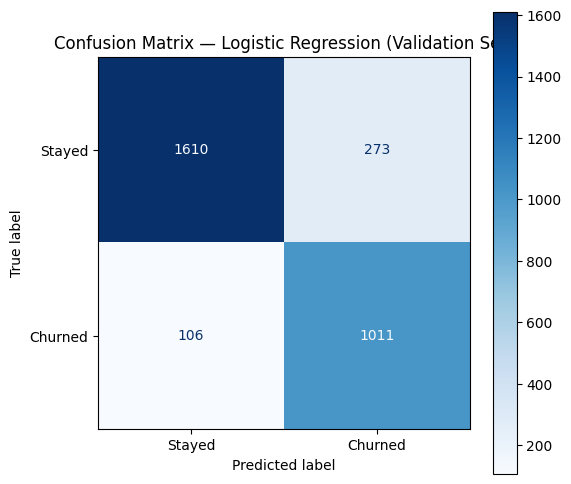

In [91]:
# ---- Confusion Matrix ----
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_val, y_val_pred)

fig, ax = plt.subplots(figsize=(6, 6))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Stayed', 'Churned'])
disp.plot(ax=ax, cmap='Blues', values_format='d')
plt.title('Confusion Matrix — Logistic Regression (Validation Set)')
plt.show()

In [92]:
# ---- Classification Report ----
from sklearn.metrics import classification_report

print("Classification Report (Validation Set):\n")
print(classification_report(y_val, y_val_pred, target_names=['Stayed', 'Churned']))

Classification Report (Validation Set):

              precision    recall  f1-score   support

      Stayed       0.94      0.86      0.89      1883
     Churned       0.79      0.91      0.84      1117

    accuracy                           0.87      3000
   macro avg       0.86      0.88      0.87      3000
weighted avg       0.88      0.87      0.88      3000



In [93]:
# ---- Generate predictions on validation set using BEST F1 configuration ----

from sklearn.linear_model import LogisticRegression

# Best Logistic Regression configuration based on F1-score
log_reg_f1 = LogisticRegression(
    C=0.01,
    penalty='l1',
    solver='saga',
    class_weight='balanced',
    max_iter=1000,
    random_state=42
)

# Train the model on the training set
log_reg_f1.fit(X_train, y_train)

# Generate validation predictions
y_val_pred = log_reg_f1.predict(X_val)

# Generate probabilities for ROC-AUC
y_val_proba = log_reg_f1.predict_proba(X_val)[:, 1]

print("Validation predictions generated using the best F1 configuration.")
print("C = 0.01")
print("Penalty = l1")
print("Solver = saga")
print("Class Weight = balanced")

Validation predictions generated using the best F1 configuration.
C = 0.01
Penalty = l1
Solver = saga
Class Weight = balanced


In [94]:
# ---- Additional Evaluation Metrics ----
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

accuracy = accuracy_score(y_val, y_val_pred)
precision = precision_score(y_val, y_val_pred)
recall = recall_score(y_val, y_val_pred)
f1 = f1_score(y_val, y_val_pred)
roc_auc = roc_auc_score(y_val, y_val_proba)

print(f"Accuracy:  {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1 Score:  {f1:.4f}")
print(f"ROC-AUC:   {roc_auc:.4f}")

Accuracy:  0.8717
Precision: 0.7542
Recall:    0.9722
F1 Score:  0.8494
ROC-AUC:   0.9621


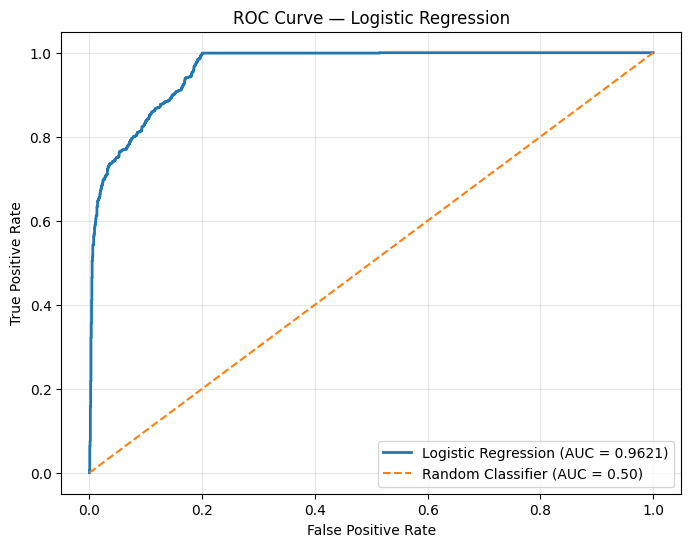

In [95]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_val, y_val_proba)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))

plt.plot(
    fpr,
    tpr,
    label=f'Logistic Regression (AUC = {roc_auc:.4f})',
    linewidth=2
)

# Random classifier reference line
plt.plot(
    [0, 1],
    [0, 1],
    linestyle='--',
    label='Random Classifier (AUC = 0.50)'
)

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve — Logistic Regression')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.show()

In [96]:
import pickle

# Save the trained logistic regression model to a pickle file
with open('logistic_regression_churn_model.pkl', 'wb') as file:
    pickle.dump(log_reg, file)

print("Model saved as logistic_regression_churn_model.pkl")

Model saved as logistic_regression_churn_model.pkl


In [97]:
from sklearn.metrics import (
    classification_report,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score
)
import numpy as np


def report(model, X, y, label):

    # Predictions
    y_pred = model.predict(X)

    # Probabilities
    y_proba = model.predict_proba(X)[:, 1]

    # Bootstrap ROC-AUC standard deviation
    rng = np.random.default_rng(42)
    y_array = np.asarray(y)

    boot = []

    for _ in range(500):
        indices = rng.integers(0, len(y_array), len(y_array))

        y_sample = y_array[indices]
        p_sample = y_proba[indices]

        # ROC-AUC requires both classes
        if len(np.unique(y_sample)) > 1:
            boot.append(roc_auc_score(y_sample, p_sample))

    # Calculate metrics
    accuracy = accuracy_score(y, y_pred)
    precision = precision_score(y, y_pred)
    recall = recall_score(y, y_pred)
    f1 = f1_score(y, y_pred)
    roc_auc = roc_auc_score(y, y_proba)
    pr_auc = average_precision_score(y, y_proba)
    roc_auc_std = np.std(boot)

    # Print results
    print(f"\n{'=' * 50}")
    print(f"=== {label} ===")
    print(f"{'=' * 50}")

    print(classification_report(
        y,
        y_pred,
        target_names=['stayed', 'churned'],
        digits=4
    ))

    print(f"accuracy     {accuracy:.4f}")
    print(f"precision    {precision:.4f}")
    print(f"recall       {recall:.4f}")
    print(f"f1           {f1:.4f}")
    print(f"roc_auc      {roc_auc:.4f}")
    print(f"pr_auc       {pr_auc:.4f}")
    print(f"roc_auc_std  {roc_auc_std:.4f}")

    # Return metrics so we can compare models later
    return {
        'model': label,
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'roc_auc': roc_auc,
        'pr_auc': pr_auc,
        'roc_auc_std': roc_auc_std
    }

In [98]:
!pip install xgboost

In [99]:
from xgboost import XGBClassifier

In [100]:
# ============================================================
# XGBoost - Training (Stronger Regularization + Early Stopping)
# ============================================================

xgb_model = XGBClassifier(
    n_estimators=500,
    max_depth=3,
    learning_rate=0.02,
    subsample=0.6,
    colsample_bytree=0.6,
    reg_alpha=1.0,
    reg_lambda=10.0,
    min_child_weight=10,
    gamma=1.0,
    random_state=42,
    eval_metric='logloss',
    early_stopping_rounds=30
)

xgb_model.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],
    verbose=False
)

print(f"XGBoost trained. Stopped at {xgb_model.best_iteration} rounds (out of 500 max).")

XGBoost trained. Stopped at 409 rounds (out of 500 max).


In [101]:
# ============================================================
# XGBoost - Training Evaluation
# ============================================================

xgb_train_results = report(
    xgb_model,
    X_train,
    y_train,
    "XGBoost - Training"
)


=== XGBoost - Training ===
              precision    recall  f1-score   support

      stayed     0.9373    0.8960    0.9162      8787
     churned     0.8368    0.8989    0.8667      5213

    accuracy                         0.8971     14000
   macro avg     0.8870    0.8974    0.8914     14000
weighted avg     0.8998    0.8971    0.8978     14000

accuracy     0.8971
precision    0.8368
recall       0.8989
f1           0.8667
roc_auc      0.9711
pr_auc       0.9501
roc_auc_std  0.0011


In [102]:
# ============================================================
# XGBoost - Validation Evaluation
# ============================================================

xgb_val_results = report(
    xgb_model,
    X_val,
    y_val,
    "XGBoost - Validation"
)


=== XGBoost - Validation ===
              precision    recall  f1-score   support

      stayed     0.9182    0.8699    0.8934      1883
     churned     0.7985    0.8693    0.8324      1117

    accuracy                         0.8697      3000
   macro avg     0.8583    0.8696    0.8629      3000
weighted avg     0.8736    0.8697    0.8707      3000

accuracy     0.8697
precision    0.7985
recall       0.8693
f1           0.8324
roc_auc      0.9628
pr_auc       0.9318
roc_auc_std  0.0029


In [103]:
from sklearn.ensemble import GradientBoostingClassifier

In [104]:
# ============================================================
# Gradient Boosting - Training
# ============================================================

gb_model = GradientBoostingClassifier(
    n_estimators=200,
    learning_rate=0.05,
    max_depth=3,
    subsample=0.8,
    random_state=42
)

gb_model.fit(X_train, y_train)

print("Gradient Boosting model trained successfully.")

Gradient Boosting model trained successfully.


In [105]:
# ============================================================
# Gradient Boosting - Training Evaluation
# ============================================================

gb_train_results = report(
    gb_model,
    X_train,
    y_train,
    "Gradient Boosting - Training"
)


=== Gradient Boosting - Training ===
              precision    recall  f1-score   support

      stayed     0.9500    0.9101    0.9296      8787
     churned     0.8585    0.9192    0.8878      5213

    accuracy                         0.9135     14000
   macro avg     0.9042    0.9147    0.9087     14000
weighted avg     0.9159    0.9135    0.9141     14000

accuracy     0.9135
precision    0.8585
recall       0.9192
f1           0.8878
roc_auc      0.9773
pr_auc       0.9587
roc_auc_std  0.0009


In [106]:
gb_val_results = report(
    gb_model,
    X_val,
    y_val,
    "Gradient Boosting - Validation"
)


=== Gradient Boosting - Validation ===
              precision    recall  f1-score   support

      stayed     0.9204    0.8720    0.8956      1883
     churned     0.8018    0.8729    0.8358      1117

    accuracy                         0.8723      3000
   macro avg     0.8611    0.8724    0.8657      3000
weighted avg     0.8762    0.8723    0.8733      3000

accuracy     0.8723
precision    0.8018
recall       0.8729
f1           0.8358
roc_auc      0.9628
pr_auc       0.9336
roc_auc_std  0.0029


In [107]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 MB 9.2 MB/s eta 0:00:00


In [108]:
from catboost import CatBoostClassifier

In [109]:
!pip install catboost
from catboost import CatBoostClassifier
# ============================================================
# CatBoost - Training (Stronger Regularization + Early Stopping)
# ============================================================

catboost_model = CatBoostClassifier(
    iterations=500,             # set high — early stopping will cut it short
    depth=4,                     # reduced from 6
    learning_rate=0.02,          # reduced from 0.05
    loss_function='Logloss',
    eval_metric='F1',
    random_seed=42,
    l2_leaf_reg=20,               # increased from 10
    early_stopping_rounds=30,
    verbose=0
)

categorical_features = [
    'education_level',
    'spend_volatility',
    'age_tier'
]

categorical_features = [col for col in categorical_features if col in X_train.columns]

catboost_model.fit(
    X_train, y_train,
    eval_set=(X_val, y_val),
    cat_features=categorical_features,
    verbose=0
)

print(f"CatBoost trained. Stopped at {catboost_model.get_best_iteration()} rounds (out of 500 max).")

CatBoost trained. Stopped at 0 rounds (out of 500 max).


In [110]:
# ============================================================
# CatBoost - Training Evaluation
# ============================================================

catboost_train_results = report(
    catboost_model,
    X_train,
    y_train,
    "CatBoost - Training"
)


=== CatBoost - Training ===
              precision    recall  f1-score   support

      stayed     0.9990    0.7917    0.8834      8787
     churned     0.7399    0.9987    0.8500      5213

    accuracy                         0.8688     14000
   macro avg     0.8695    0.8952    0.8667     14000
weighted avg     0.9025    0.8688    0.8710     14000

accuracy     0.8688
precision    0.7399
recall       0.9987
f1           0.8500
roc_auc      0.9503
pr_auc       0.8964
roc_auc_std  0.0015


In [111]:
# ============================================================
# CatBoost - Validation Evaluation
# ============================================================

catboost_val_results = report(
    catboost_model,
    X_val,
    y_val,
    "CatBoost - Validation"
)


=== CatBoost - Validation ===
              precision    recall  f1-score   support

      stayed     0.9993    0.7987    0.8878      1883
     churned     0.7465    0.9991    0.8545      1117

    accuracy                         0.8733      3000
   macro avg     0.8729    0.8989    0.8712      3000
weighted avg     0.9052    0.8733    0.8754      3000

accuracy     0.8733
precision    0.7465
recall       0.9991
f1           0.8545
roc_auc      0.9534
pr_auc       0.9057
roc_auc_std  0.0033


In [112]:
from sklearn.ensemble import RandomForestClassifier

In [113]:
# ============================================================
# Random Forest - Training (Further Reduced Capacity)
# ============================================================

rf_model = RandomForestClassifier(
    n_estimators=300,
    max_depth=6,
    min_samples_split=50,
    min_samples_leaf=25,
    max_features='sqrt',
    random_state=42,
    n_jobs=-1
)

rf_model.fit(X_train, y_train)

print("Random Forest model trained successfully.")

Random Forest model trained successfully.


In [114]:
# ============================================================
# Random Forest - Training Evaluation
# ============================================================

rf_train_results = report(
    rf_model,
    X_train,
    y_train,
    "Random Forest - Training"
)


=== Random Forest - Training ===
              precision    recall  f1-score   support

      stayed     0.8607    0.9629    0.9090      8787
     churned     0.9218    0.7374    0.8194      5213

    accuracy                         0.8789     14000
   macro avg     0.8913    0.8501    0.8642     14000
weighted avg     0.8835    0.8789    0.8756     14000

accuracy     0.8789
precision    0.9218
recall       0.7374
f1           0.8194
roc_auc      0.9700
pr_auc       0.9486
roc_auc_std  0.0011


In [115]:
# ============================================================
# Random Forest - Validation Evaluation
# ============================================================

rf_val_results = report(
    rf_model,
    X_val,
    y_val,
    "Random Forest - Validation"
)


=== Random Forest - Validation ===
              precision    recall  f1-score   support

      stayed     0.8619    0.9575    0.9072      1883
     churned     0.9119    0.7413    0.8178      1117

    accuracy                         0.8770      3000
   macro avg     0.8869    0.8494    0.8625      3000
weighted avg     0.8805    0.8770    0.8739      3000

accuracy     0.8770
precision    0.9119
recall       0.7413
f1           0.8178
roc_auc      0.9640
pr_auc       0.9376
roc_auc_std  0.0028


In [116]:
!pip install lightgbm

In [117]:
from lightgbm import LGBMClassifier

In [118]:
!pip install lightgbm
from lightgbm import LGBMClassifier
import lightgbm as lgb
# ============================================================
# LightGBM - Training (Stronger Regularization + Early Stopping)
# ============================================================

lgbm_model = LGBMClassifier(
    n_estimators=500,           # set high — early stopping will cut it short
    learning_rate=0.02,          # reduced from 0.05
    max_depth=4,                  # reduced from 6
    num_leaves=15,                # reduced from 31
    subsample=0.6,                # reduced from 0.8
    colsample_bytree=0.6,         # reduced from 0.8
    reg_alpha=1.0,                 # increased from 0.5
    reg_lambda=10.0,               # increased from 5.0
    min_child_samples=50,          # increased from 30
    random_state=42,
    verbosity=-1
)

lgbm_model.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],
    callbacks=[lgb.early_stopping(stopping_rounds=30, verbose=False)]
)

print(f"LightGBM trained. Stopped at {lgbm_model.best_iteration_} rounds (out of 500 max).")

LightGBM trained. Stopped at 388 rounds (out of 500 max).


In [119]:
# ============================================================
# LightGBM - Training Evaluation
# ============================================================

lgbm_train_results = report(
    lgbm_model,
    X_train,
    y_train,
    "LightGBM - Training"
)


=== LightGBM - Training ===
              precision    recall  f1-score   support

      stayed     0.9366    0.9043    0.9202      8787
     churned     0.8475    0.8968    0.8715      5213

    accuracy                         0.9015     14000
   macro avg     0.8921    0.9005    0.8958     14000
weighted avg     0.9034    0.9015    0.9020     14000

accuracy     0.9015
precision    0.8475
recall       0.8968
f1           0.8715
roc_auc      0.9742
pr_auc       0.9567
roc_auc_std  0.0010


In [120]:
# ============================================================
# LightGBM - Validation Evaluation
# ============================================================

lgbm_val_results = report(
    lgbm_model,
    X_val,
    y_val,
    "LightGBM - Validation"
)


=== LightGBM - Validation ===
              precision    recall  f1-score   support

      stayed     0.9169    0.8731    0.8945      1883
     churned     0.8020    0.8666    0.8330      1117

    accuracy                         0.8707      3000
   macro avg     0.8594    0.8698    0.8637      3000
weighted avg     0.8741    0.8707    0.8716      3000

accuracy     0.8707
precision    0.8020
recall       0.8666
f1           0.8330
roc_auc      0.9634
pr_auc       0.9360
roc_auc_std  0.0028


In [121]:
# ============================================================
# Validation Performance Comparison
# ============================================================

boosting_results = pd.DataFrame([
    xgb_val_results,
    gb_val_results,
    catboost_val_results,
    rf_val_results,
    lgbm_val_results
])

boosting_results = boosting_results.sort_values(
    by='f1',
    ascending=False
).reset_index(drop=True)

boosting_results

,model,accuracy,precision,recall,f1,roc_auc,pr_auc,roc_auc_std
0,CatBoost - Validation,0.873333,0.746488,0.999105,0.854518,0.953354,0.905706,0.003303
1,Gradient Boosting - Validation,0.872333,0.801809,0.872874,0.835834,0.962767,0.933552,0.002888
2,LightGBM - Validation,0.870667,0.801988,0.866607,0.833046,0.963417,0.935962,0.002801
3,XGBoost - Validation,0.869667,0.798520,0.869293,0.832405,0.962786,0.931819,0.002885
4,Random Forest - Validation,0.877000,0.911894,0.741271,0.817778,0.964033,0.937557,0.002775


In [122]:
from sklearn.ensemble import AdaBoostClassifier
# ============================================================
# AdaBoost - Training
# ============================================================

ada_model = AdaBoostClassifier(
    n_estimators=200,
    learning_rate=0.05,
    random_state=42
)

ada_model.fit(X_train, y_train)

print("AdaBoost model trained successfully.")

AdaBoost model trained successfully.


In [123]:
# ============================================================
# AdaBoost - Training Evaluation
# ============================================================

ada_train_results = report(
    ada_model,
    X_train,
    y_train,
    "AdaBoost - Training"
)


=== AdaBoost - Training ===
              precision    recall  f1-score   support

      stayed     0.9990    0.7917    0.8834      8787
     churned     0.7399    0.9987    0.8500      5213

    accuracy                         0.8688     14000
   macro avg     0.8695    0.8952    0.8667     14000
weighted avg     0.9025    0.8688    0.8710     14000

accuracy     0.8688
precision    0.7399
recall       0.9987
f1           0.8500
roc_auc      0.9585
pr_auc       0.8969
roc_auc_std  0.0012


In [124]:
# ============================================================
# AdaBoost - Validation Evaluation
# ============================================================

ada_val_results = report(
    ada_model,
    X_val,
    y_val,
    "AdaBoost - Validation"
)


=== AdaBoost - Validation ===
              precision    recall  f1-score   support

      stayed     0.9993    0.7987    0.8878      1883
     churned     0.7465    0.9991    0.8545      1117

    accuracy                         0.8733      3000
   macro avg     0.8729    0.8989    0.8712      3000
weighted avg     0.9052    0.8733    0.8754      3000

accuracy     0.8733
precision    0.7465
recall       0.9991
f1           0.8545
roc_auc      0.9639
pr_auc       0.9078
roc_auc_std  0.0025


In [125]:
import pickle

# Save the AdaBoost model to a pickle file
with open('adaboost_model.pkl', 'wb') as file:
    pickle.dump(ada_model, file)

print("Model saved as adaboost_model.pkl")

Model saved as adaboost_model.pkl


In [126]:
from sklearn.svm import SVC
# ============================================================
# SVC - Training
# ============================================================

svc_model = SVC(
    kernel='rbf',
    C=1.0,
    probability=True,
    random_state=42
)

svc_model.fit(X_train, y_train)

print("SVC model trained successfully.")

SVC model trained successfully.


In [127]:
# ============================================================
# SVC - Training Evaluation
# ============================================================

svc_train_results = report(
    svc_model,
    X_train,
    y_train,
    "SVC - Training"
)


=== SVC - Training ===
              precision    recall  f1-score   support

      stayed     0.9574    0.8797    0.9169      8787
     churned     0.8216    0.9340    0.8742      5213

    accuracy                         0.8999     14000
   macro avg     0.8895    0.9069    0.8956     14000
weighted avg     0.9068    0.8999    0.9010     14000

accuracy     0.8999
precision    0.8216
recall       0.9340
f1           0.8742
roc_auc      0.9725
pr_auc       0.9485
roc_auc_std  0.0011


In [128]:
# ============================================================
# SVC - Validation Evaluation
# ============================================================

svc_val_results = report(
    svc_model,
    X_val,
    y_val,
    "SVC - Validation"
)


=== SVC - Validation ===
              precision    recall  f1-score   support

      stayed     0.9354    0.8619    0.8972      1883
     churned     0.7945    0.8997    0.8438      1117

    accuracy                         0.8760      3000
   macro avg     0.8650    0.8808    0.8705      3000
weighted avg     0.8830    0.8760    0.8773      3000

accuracy     0.8760
precision    0.7945
recall       0.8997
f1           0.8438
roc_auc      0.9550
pr_auc       0.9131
roc_auc_std  0.0034


In [129]:
import pickle

# Save the SVC model to a pickle file
with open('svc_model.pkl', 'wb') as file:
    pickle.dump(svc_model, file)

print("Model saved as svc_model.pkl")

Model saved as svc_model.pkl


In [130]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
# ============================================================
# LDA - Training
# ============================================================

lda_model = LinearDiscriminantAnalysis()

lda_model.fit(X_train, y_train)

print("LDA model trained successfully.")

LDA model trained successfully.


In [131]:
# ============================================================
# LDA - Training Evaluation
# ============================================================

lda_train_results = report(
    lda_model,
    X_train,
    y_train,
    "LDA - Training"
)


=== LDA - Training ===
              precision    recall  f1-score   support

      stayed     0.9977    0.7936    0.8840      8787
     churned     0.7413    0.9969    0.8503      5213

    accuracy                         0.8693     14000
   macro avg     0.8695    0.8952    0.8671     14000
weighted avg     0.9022    0.8693    0.8715     14000

accuracy     0.8693
precision    0.7413
recall       0.9969
f1           0.8503
roc_auc      0.9599
pr_auc       0.9264
roc_auc_std  0.0014


In [132]:
# ============================================================
# LDA - Validation Evaluation
# ============================================================

lda_val_results = report(
    lda_model,
    X_val,
    y_val,
    "LDA - Validation"
)


=== LDA - Validation ===
              precision    recall  f1-score   support

      stayed     0.9974    0.8024    0.8893      1883
     churned     0.7495    0.9964    0.8555      1117

    accuracy                         0.8747      3000
   macro avg     0.8734    0.8994    0.8724      3000
weighted avg     0.9051    0.8747    0.8767      3000

accuracy     0.8747
precision    0.7495
recall       0.9964
f1           0.8555
roc_auc      0.9619
pr_auc       0.9307
roc_auc_std  0.0029


In [133]:
import pickle

# Save the LDA model to a pickle file
with open('lda_model.pkl', 'wb') as file:
    pickle.dump(lda_model, file)

print("Model saved as lda_model.pkl")

Model saved as lda_model.pkl


In [134]:
from sklearn.ensemble import ExtraTreesClassifier
# ============================================================
# ExtraTrees - Training
# ============================================================

extratrees_model = ExtraTreesClassifier(
    n_estimators=300,
    max_depth=6,
    min_samples_split=20,
    min_samples_leaf=10,
    max_features='sqrt',
    random_state=42,
    n_jobs=-1
)

extratrees_model.fit(X_train, y_train)

print("ExtraTrees model trained successfully.")

ExtraTrees model trained successfully.


In [135]:
# ============================================================
# ExtraTrees - Training Evaluation
# ============================================================

extratrees_train_results = report(
    extratrees_model,
    X_train,
    y_train,
    "ExtraTrees - Training"
)


=== ExtraTrees - Training ===
              precision    recall  f1-score   support

      stayed     0.9030    0.9011    0.9020      8787
     churned     0.8339    0.8368    0.8353      5213

    accuracy                         0.8771     14000
   macro avg     0.8684    0.8689    0.8687     14000
weighted avg     0.8772    0.8771    0.8772     14000

accuracy     0.8771
precision    0.8339
recall       0.8368
f1           0.8353
roc_auc      0.9624
pr_auc       0.9318
roc_auc_std  0.0013


In [136]:
# ============================================================
# ExtraTrees - Validation Evaluation
# ============================================================

extratrees_val_results = report(
    extratrees_model,
    X_val,
    y_val,
    "ExtraTrees - Validation"
)


=== ExtraTrees - Validation ===
              precision    recall  f1-score   support

      stayed     0.8956    0.9071    0.9013      1883
     churned     0.8399    0.8218    0.8308      1117

    accuracy                         0.8753      3000
   macro avg     0.8678    0.8645    0.8660      3000
weighted avg     0.8749    0.8753    0.8751      3000

accuracy     0.8753
precision    0.8399
recall       0.8218
f1           0.8308
roc_auc      0.9623
pr_auc       0.9315
roc_auc_std  0.0029


In [137]:
import pickle

# Save the ExtraTrees model to a pickle file
with open('extratrees_model.pkl', 'wb') as file:
    pickle.dump(extratrees_model, file)

print("Model saved as extratrees_model.pkl")

Model saved as extratrees_model.pkl


In [138]:
# ============================================================
# FINAL FEATURE IMPORTANCE COMPARISON
# ============================================================

import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 1. Logistic Regression importance
# ------------------------------------------------------------

lr_importance = pd.DataFrame({
    'Feature': X_train.columns,
    'Logistic Regression': abs(log_reg_f1.coef_[0])
})

# ------------------------------------------------------------
# 2. Tree-based / coefficient-based model importance
# ------------------------------------------------------------

feature_comparison = pd.DataFrame({
    'Feature': X_train.columns,

    'Logistic Regression': abs(log_reg_f1.coef_[0]),

    'XGBoost': xgb_model.feature_importances_,

    'Gradient Boosting': gb_model.feature_importances_,

    'CatBoost': catboost_model.feature_importances_,

    'Random Forest': rf_model.feature_importances_,

    'LightGBM': lgbm_model.feature_importances_,

    'AdaBoost': ada_model.feature_importances_,

    'LDA': abs(lda_model.coef_[0]),

    'ExtraTrees': extratrees_model.feature_importances_

    # Note: SVC (rbf kernel) is excluded — RBF kernels don't expose
    # feature_importances_ or coef_, since the decision boundary is
    # computed in a transformed, non-linear feature space.
})

# ------------------------------------------------------------
# 3. Display complete table
# ------------------------------------------------------------

feature_comparison = feature_comparison.sort_values(
    by='XGBoost',
    ascending=False
)

print("Feature Importance Comparison Across All Models:")
display(feature_comparison)

Feature Importance Comparison Across All Models:


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,Feature,Logistic Regression,XGBoost,Gradient Boosting,CatBoost,Random Forest,LightGBM,AdaBoost,LDA,ExtraTrees
43,inactivity_flag,5.467927,0.401786,4.970607e-01,89.944539,0.432262,82,0.405545,8.522898,0.561934
41,months_since_last_txn,0.274968,0.268424,3.043883e-01,0.000000,0.405653,284,0.470251,0.003273,0.306268
7,total_spend_last_month,0.000000,0.047935,1.451158e-01,0.000000,0.026560,309,0.111081,0.082327,0.003222
9,total_spend_last_6_months,0.314635,0.041556,1.163700e-02,9.299132,0.018582,109,0.013123,0.186820,0.012959
36,total_bank_balance,0.000000,0.038129,2.883338e-03,0.000000,0.016481,47,0.000000,3.309623,0.016415
10,total_spend_last_year,0.411975,0.035397,5.032140e-03,0.000000,0.021416,80,0.000000,7.284238,0.014604
12,max_monthly_spend,0.127904,0.017217,3.358157e-03,0.000000,0.015869,56,0.000000,0.097109,0.016963
8,total_spend_last_3_months,0.050249,0.005111,3.261317e-03,0.000000,0.007613,59,0.000000,0.046503,0.011714
29,credit_limit,0.000000,0.004644,1.218262e-03,0.000000,0.013472,26,0.000000,3.146163,0.013270
26,frequent_late_payments,0.000000,0.003964,3.248307e-04,0.000000,0.000381,38,0.000000,0.073357,0.000273


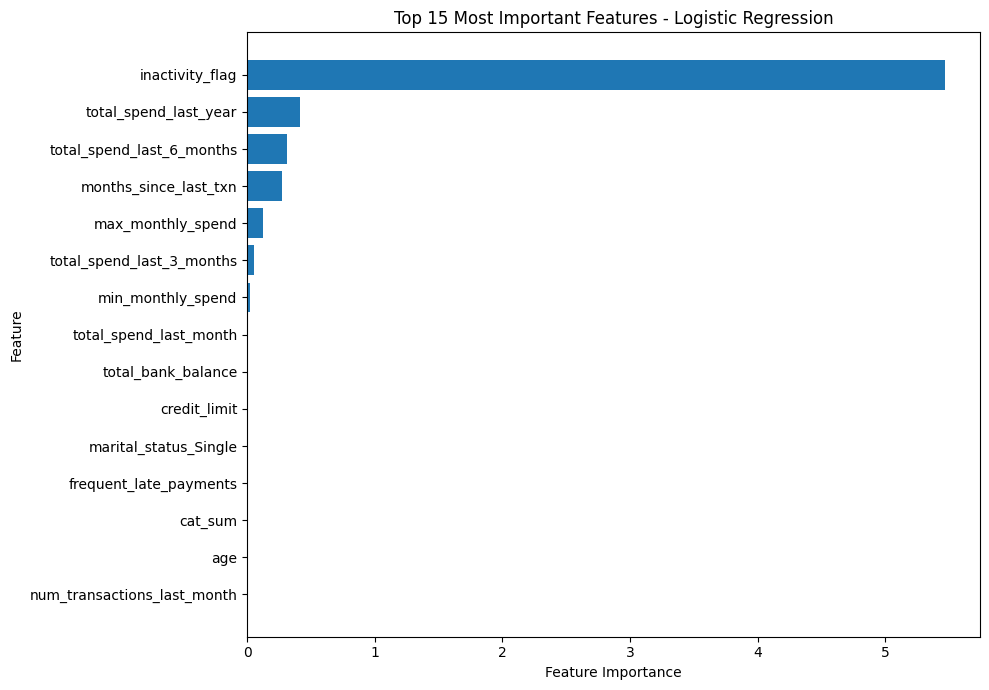

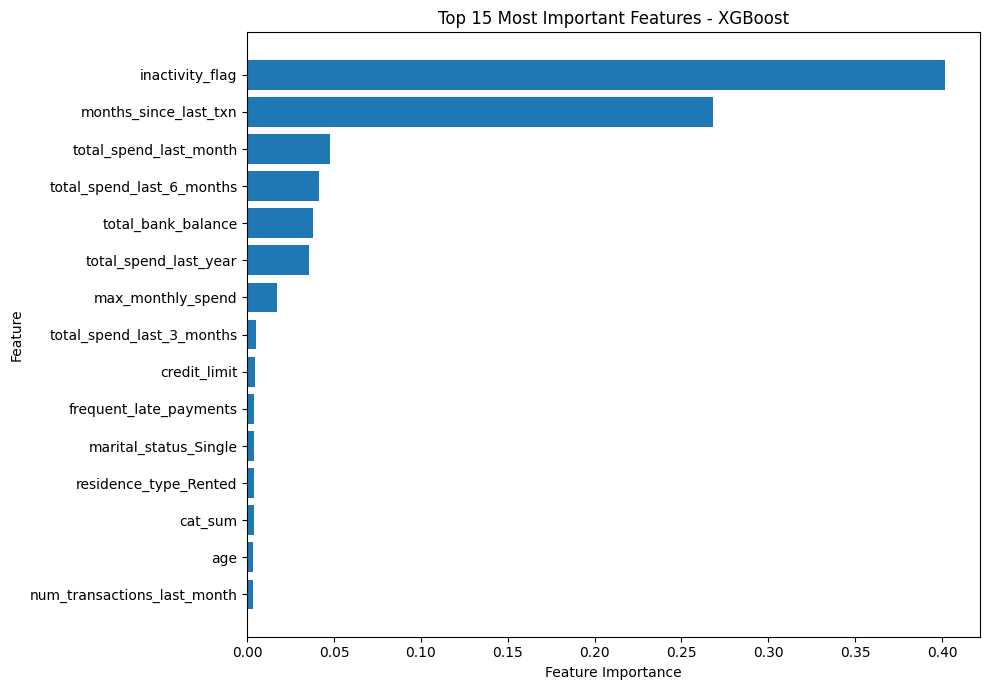

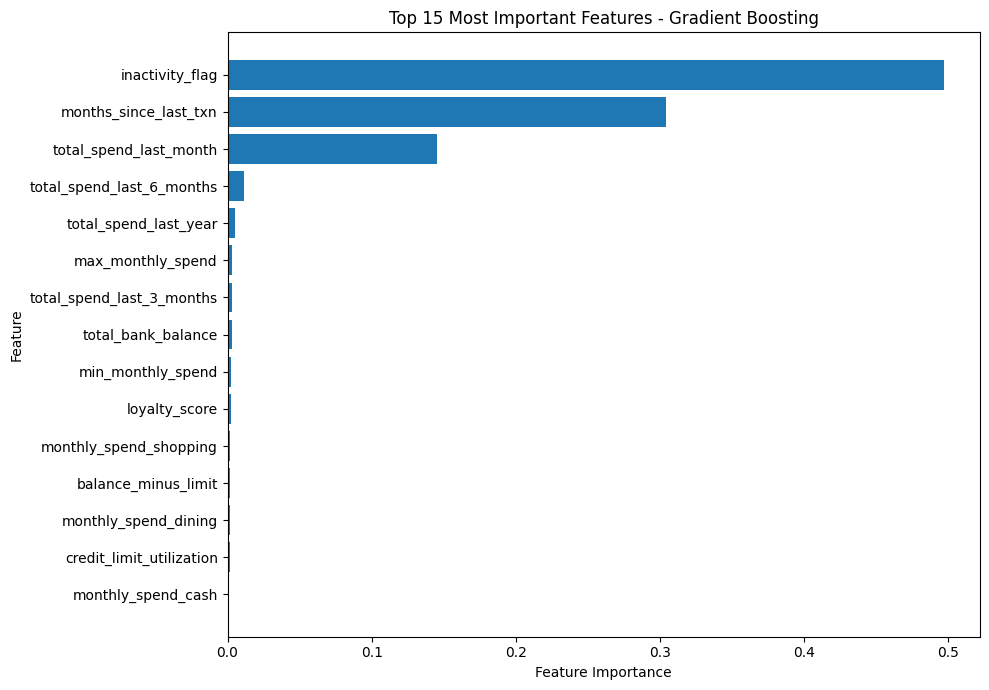

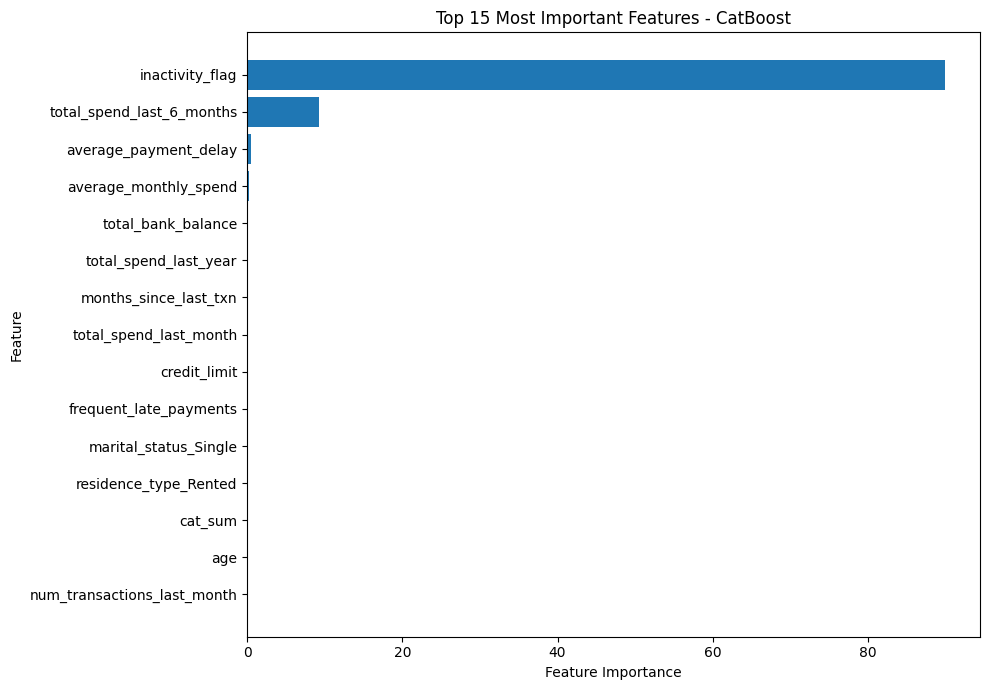

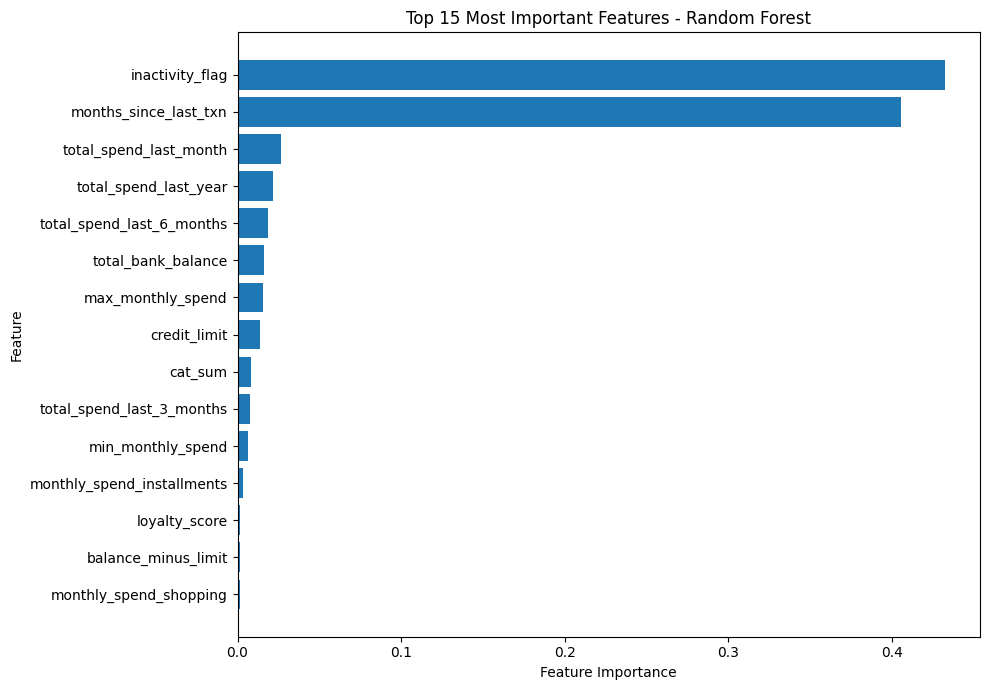

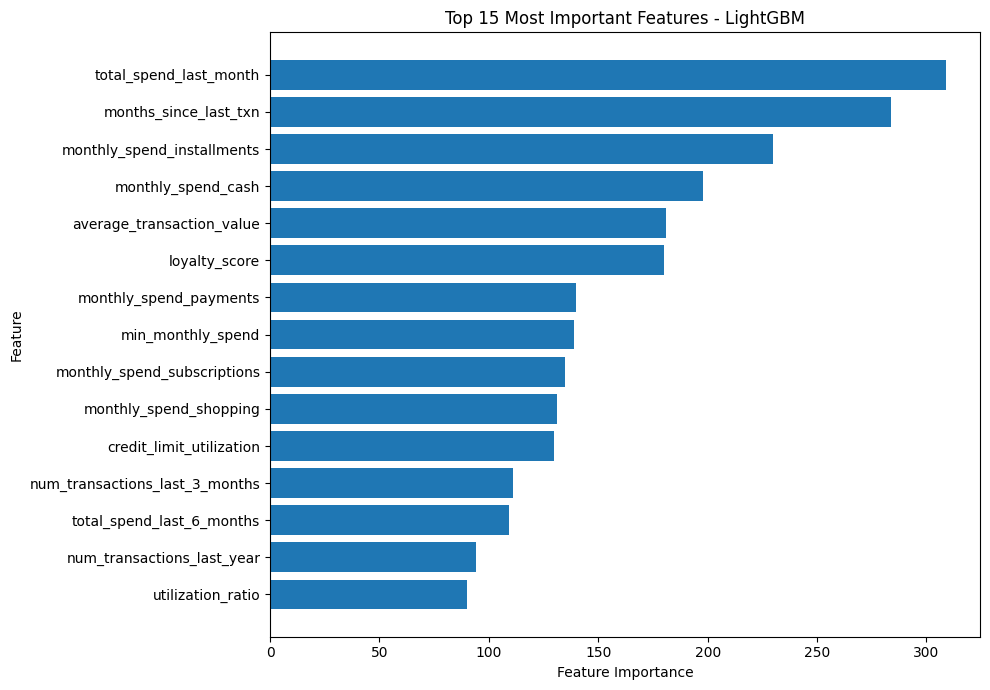

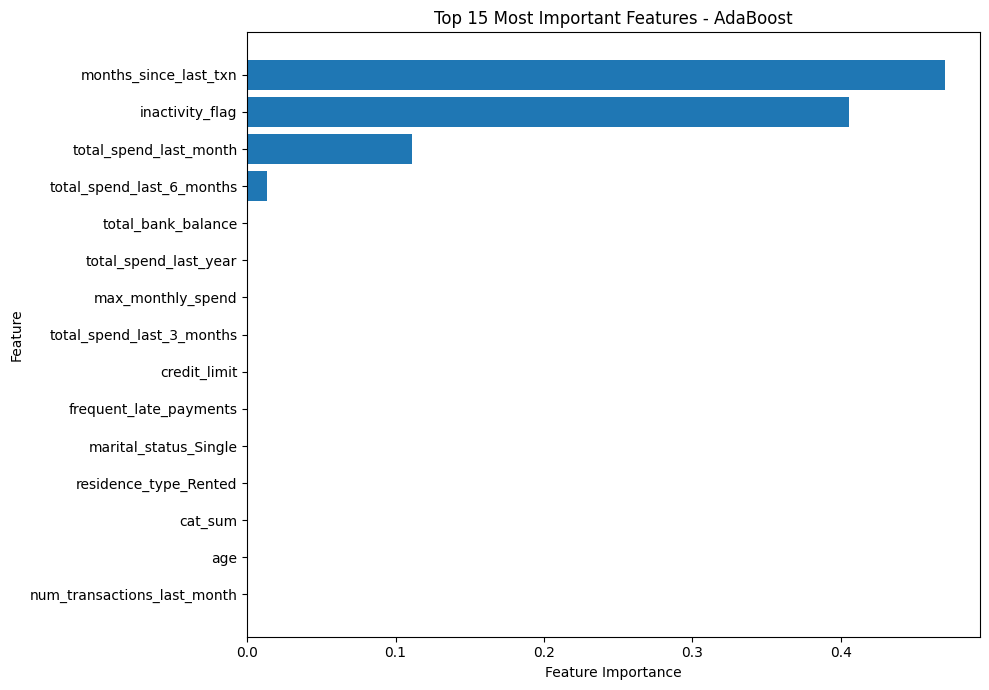

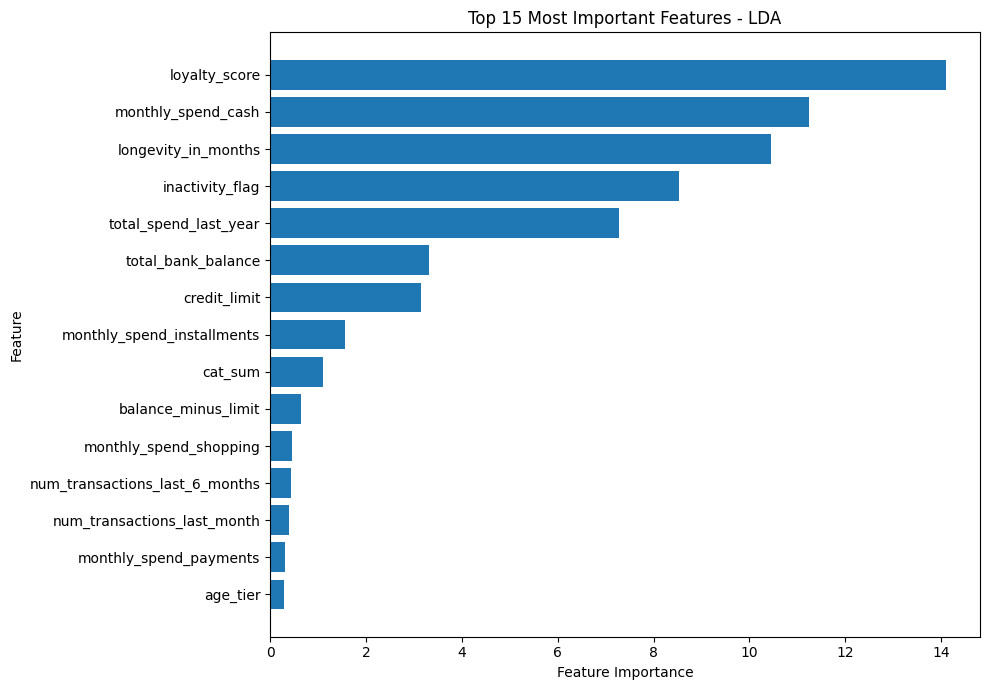

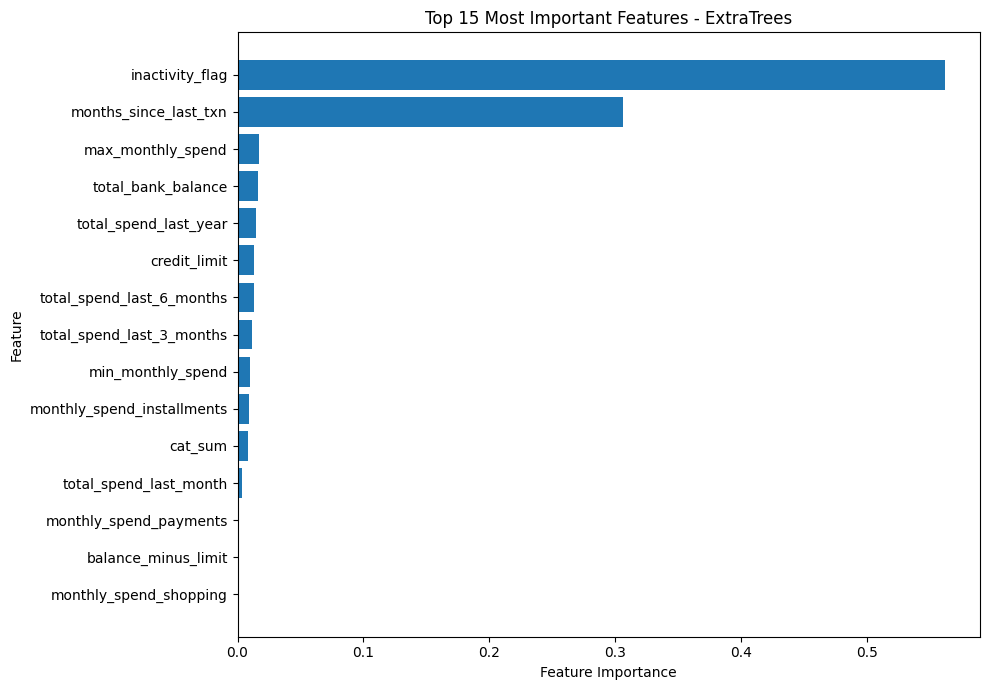

In [139]:
# ============================================================
# TOP 15 FEATURE IMPORTANCE GRAPHS - ALL MODELS
# ============================================================

models = [
    'Logistic Regression',
    'XGBoost',
    'Gradient Boosting',
    'CatBoost',
    'Random Forest',
    'LightGBM',
    'AdaBoost',
    'LDA',
    'ExtraTrees'
]

for model in models:

    top_features = (
        feature_comparison[
            ['Feature', model]
        ]
        .sort_values(by=model, ascending=False)
        .head(15)
    )

    plt.figure(figsize=(10, 7))

    plt.barh(
        top_features['Feature'][::-1],
        top_features[model][::-1]
    )

    plt.xlabel('Feature Importance')
    plt.ylabel('Feature')
    plt.title(f'Top 15 Most Important Features - {model}')

    plt.tight_layout()
    plt.show()

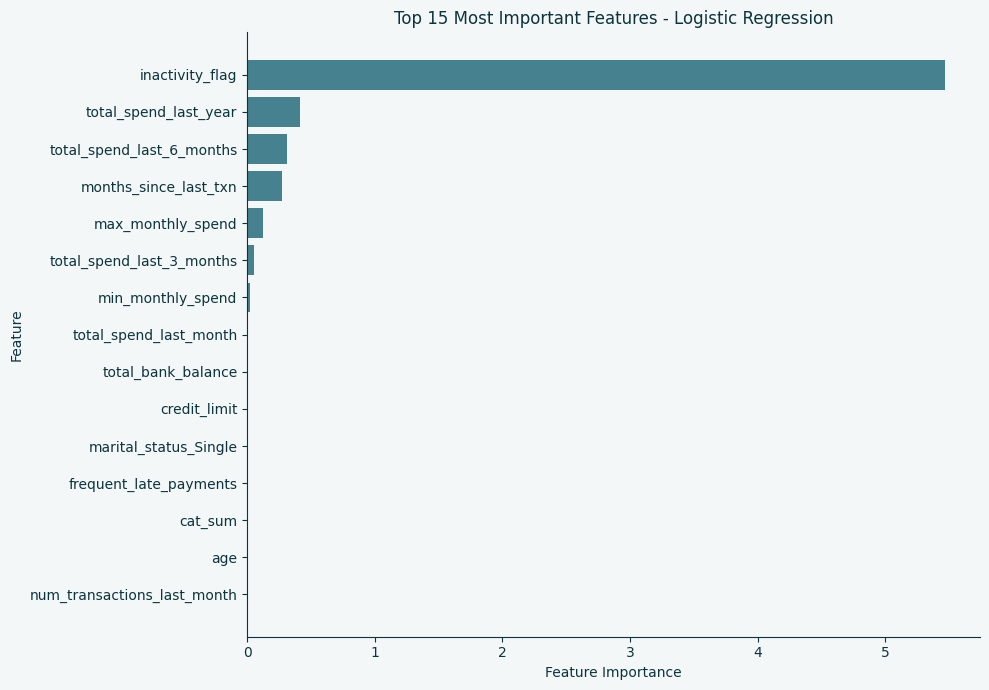

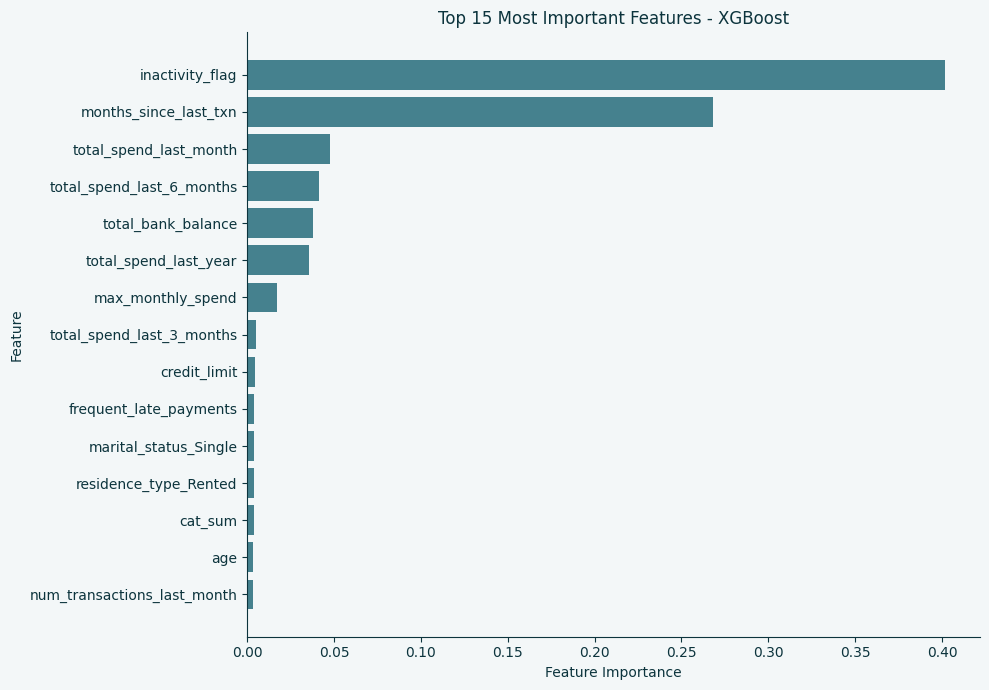

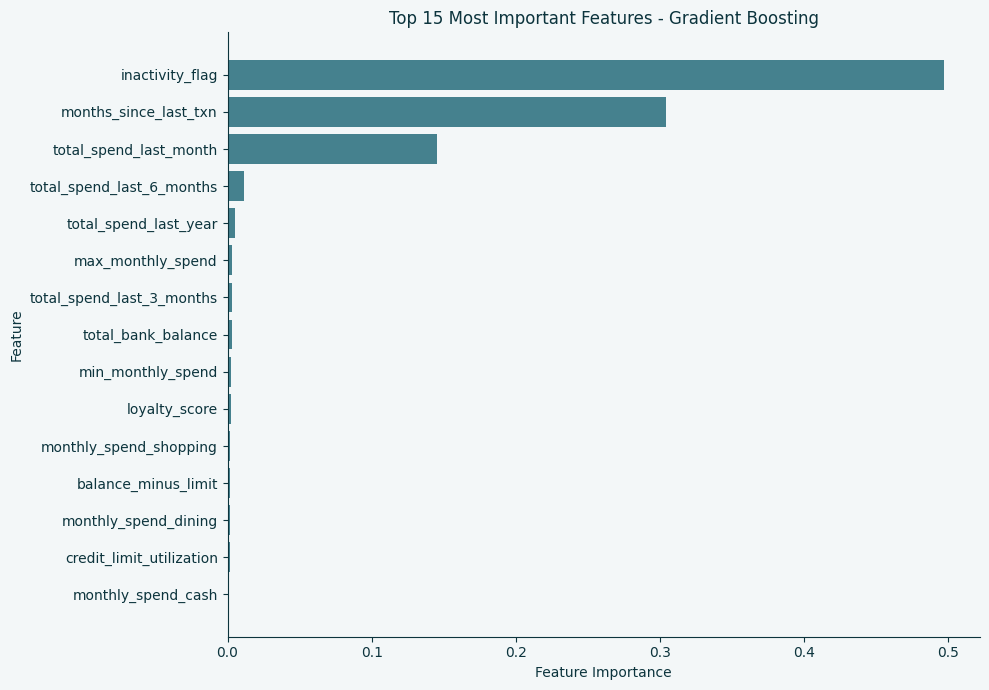

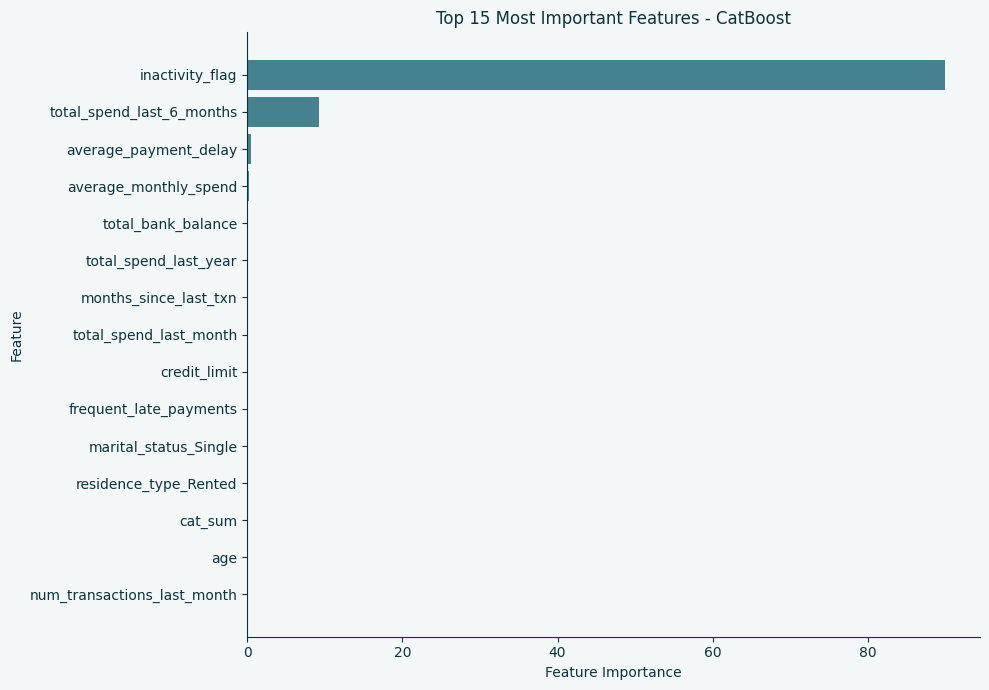

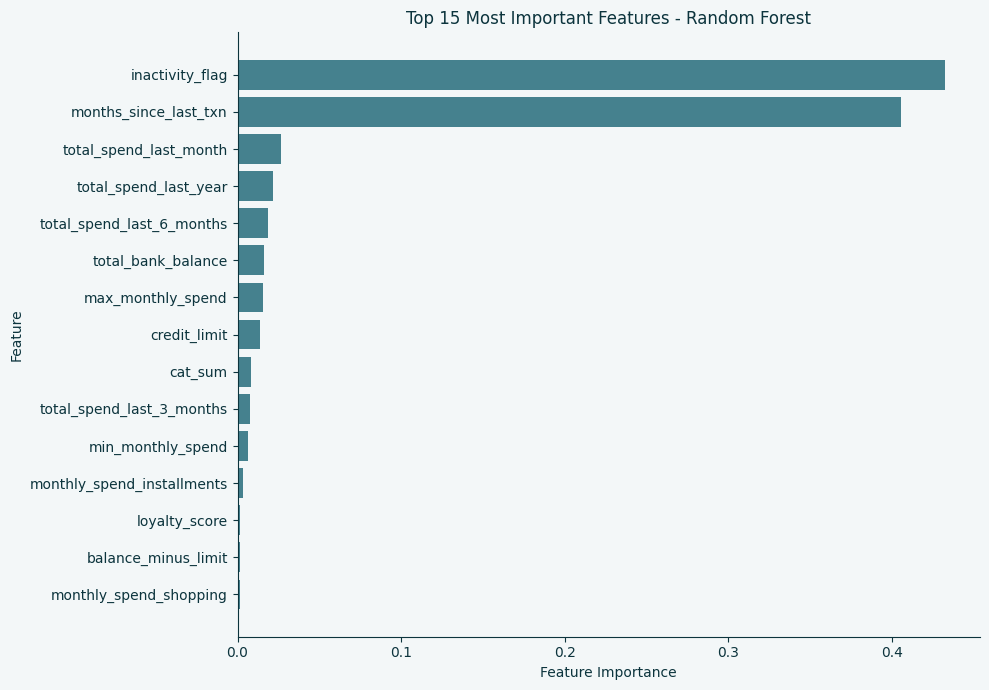

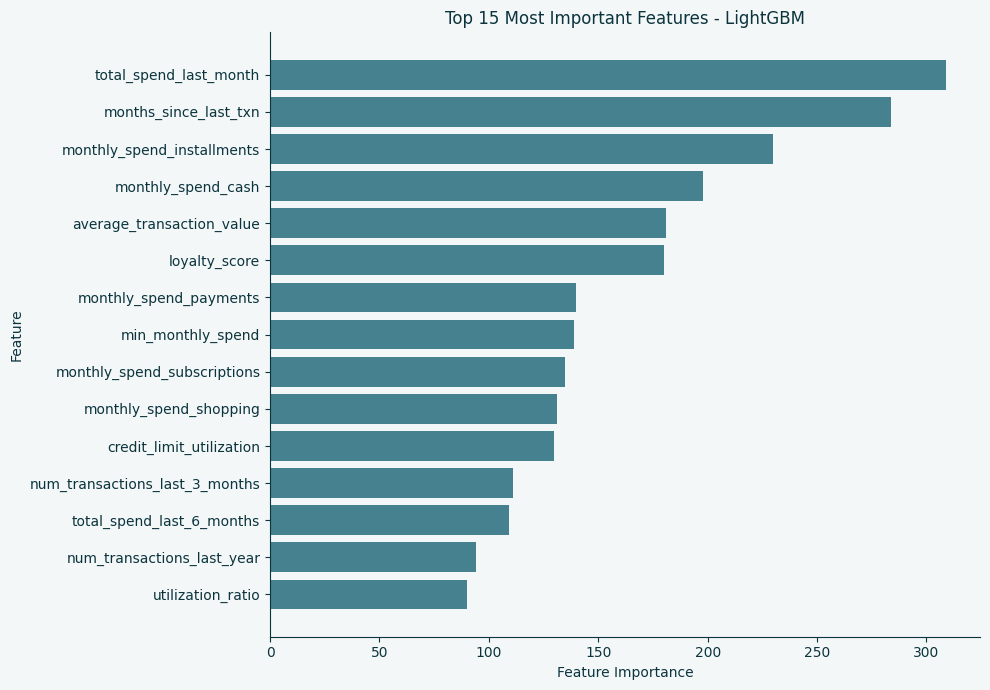

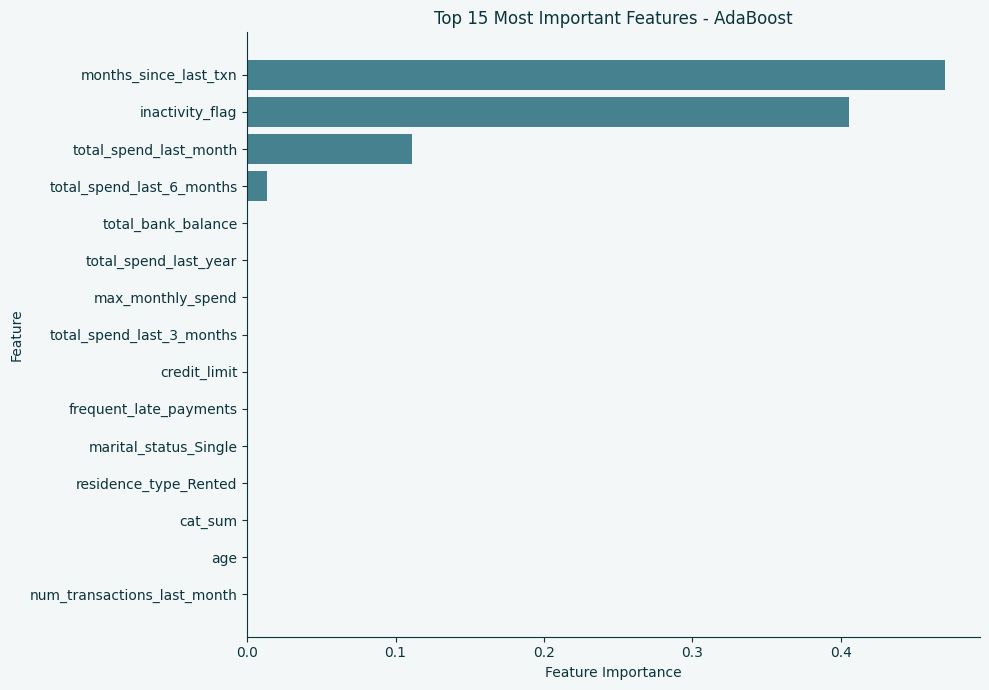

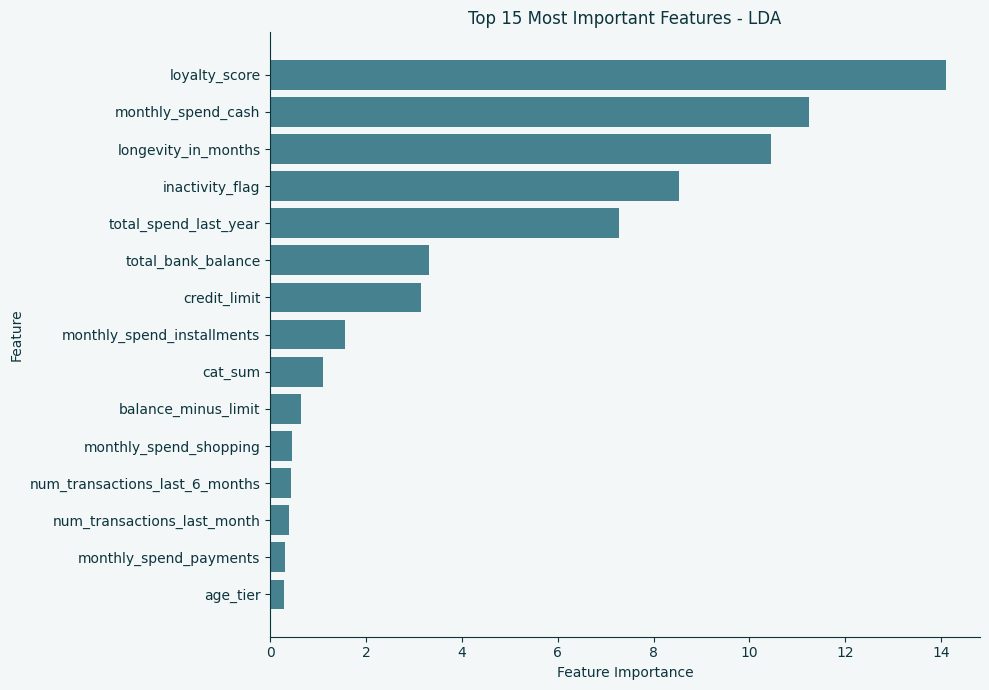

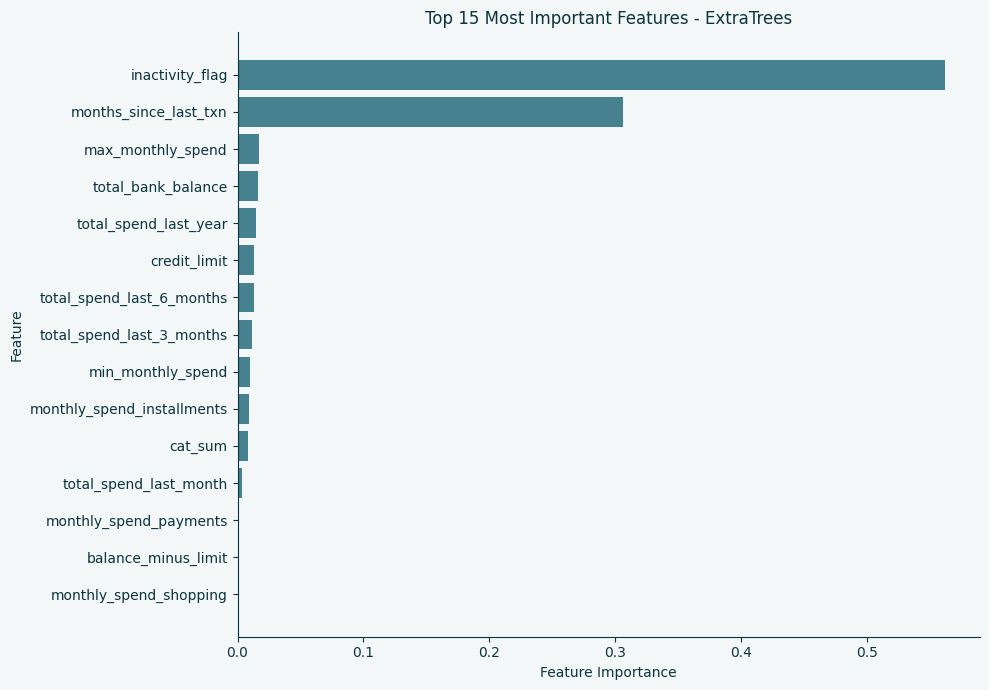

In [140]:
# ============================================================
# TOP 15 FEATURE IMPORTANCE GRAPHS - ALL MODELS
# Colors matched to presentation template
# ============================================================

# Colors sampled directly from the slide template
DARK_NAVY   = '#0c343d'
MEDIUM_TEAL = '#45818e'
LIGHT_TEAL  = '#7ba5ad'
BG_COLOR    = '#f3f7f8'

models = [
    'Logistic Regression',
    'XGBoost',
    'Gradient Boosting',
    'CatBoost',
    'Random Forest',
    'LightGBM',
    'AdaBoost',
    'LDA',
    'ExtraTrees'
]

for model in models:

    top_features = (
        feature_comparison[
            ['Feature', model]
        ]
        .sort_values(by=model, ascending=False)
        .head(15)
    )

    fig, ax = plt.subplots(figsize=(10, 7))

    ax.barh(
        top_features['Feature'][::-1],
        top_features[model][::-1],
        color=MEDIUM_TEAL
    )

    ax.set_xlabel('Feature Importance', color=DARK_NAVY)
    ax.set_ylabel('Feature', color=DARK_NAVY)
    ax.set_title(f'Top 15 Most Important Features - {model}', color=DARK_NAVY)

    ax.tick_params(colors=DARK_NAVY)
    ax.spines[['top', 'right']].set_visible(False)
    ax.spines[['left', 'bottom']].set_color(DARK_NAVY)
    ax.set_facecolor(BG_COLOR)
    fig.patch.set_facecolor(BG_COLOR)

    plt.tight_layout()
    plt.show()

In [141]:
# ============================================================
# FINAL TEST SET EVALUATION — ALL MODELS (Champion Selection)
# ============================================================

log_reg_test_results = report(log_reg_f1, X_test, y_test, "Logistic Regression - Test")
xgb_test_results = report(xgb_model, X_test, y_test, "XGBoost - Test")
gb_test_results = report(gb_model, X_test, y_test, "Gradient Boosting - Test")
catboost_test_results = report(catboost_model, X_test, y_test, "CatBoost - Test")
rf_test_results = report(rf_model, X_test, y_test, "Random Forest - Test")
lgbm_test_results = report(lgbm_model, X_test, y_test, "LightGBM - Test")
ada_test_results = report(ada_model, X_test, y_test, "AdaBoost - Test")
svc_test_results = report(svc_model, X_test, y_test, "SVC - Test")
lda_test_results = report(lda_model, X_test, y_test, "LDA - Test")
extratrees_test_results = report(extratrees_model, X_test, y_test, "ExtraTrees - Test")


=== Logistic Regression - Test ===
              precision    recall  f1-score   support

      stayed     0.9817    0.7966    0.8795      1883
     churned     0.7398    0.9749    0.8413      1117

    accuracy                         0.8630      3000
   macro avg     0.8607    0.8858    0.8604      3000
weighted avg     0.8916    0.8630    0.8653      3000

accuracy     0.8630
precision    0.7398
recall       0.9749
f1           0.8413
roc_auc      0.9577
pr_auc       0.9237
roc_auc_std  0.0028

=== XGBoost - Test ===
              precision    recall  f1-score   support

      stayed     0.9195    0.8614    0.8895      1883
     churned     0.7888    0.8729    0.8287      1117

    accuracy                         0.8657      3000
   macro avg     0.8542    0.8671    0.8591      3000
weighted avg     0.8708    0.8657    0.8669      3000

accuracy     0.8657
precision    0.7888
recall       0.8729
f1           0.8287
roc_auc      0.9571
pr_auc       0.9214
roc_auc_std  0.0028

=== G

In [142]:
# ============================================================
# Test Set Performance Comparison — Champion Model
# ============================================================

test_results = pd.DataFrame([
    log_reg_test_results,
    xgb_test_results,
    gb_test_results,
    catboost_test_results,
    rf_test_results,
    lgbm_test_results,
    ada_test_results,
    svc_test_results,
    lda_test_results,
    extratrees_test_results
])

test_results = test_results.sort_values(
    by='f1',
    ascending=False
).reset_index(drop=True)

print("Final Test Set Rankings (sorted by F1):")
test_results

Final Test Set Rankings (sorted by F1):


,model,accuracy,precision,recall,f1,roc_auc,pr_auc,roc_auc_std
0,AdaBoost - Test,0.863000,0.731627,0.998209,0.844377,0.956719,0.893292,0.002554
1,CatBoost - Test,0.863000,0.731627,0.998209,0.844377,0.948199,0.891733,0.003136
2,LDA - Test,0.862000,0.731707,0.993733,0.842825,0.955767,0.919122,0.002968
3,Logistic Regression - Test,0.863000,0.739810,0.974933,0.841251,0.957687,0.923745,0.002808
4,SVC - Test,0.865667,0.776744,0.897046,0.832572,0.951908,0.909299,0.003256
5,XGBoost - Test,0.865667,0.788835,0.872874,0.828729,0.957127,0.921424,0.002819
6,ExtraTrees - Test,0.869667,0.816754,0.837959,0.827221,0.957796,0.925099,0.002880
7,Gradient Boosting - Test,0.864000,0.789861,0.864816,0.825641,0.955521,0.918761,0.003076
8,LightGBM - Test,0.864000,0.789861,0.864816,0.825641,0.956162,0.917860,0.002905
9,Random Forest - Test,0.869333,0.898790,0.731423,0.806515,0.957865,0.926112,0.002858


In [143]:
# ============================================================
# Identify the Champion Model
# ============================================================

champion = test_results.iloc[0]

print("=" * 50)
print("CHAMPION MODEL")
print("=" * 50)
print(f"Model     : {champion['model']}")
print(f"Accuracy  : {champion['accuracy']:.4f}")
print(f"Precision : {champion['precision']:.4f}")
print(f"Recall    : {champion['recall']:.4f}")
print(f"F1-Score  : {champion['f1']:.4f}")
print(f"ROC-AUC   : {champion['roc_auc']:.4f}")

CHAMPION MODEL
Model     : AdaBoost - Test
Accuracy  : 0.8630
Precision : 0.7316
Recall    : 0.9982
F1-Score  : 0.8444
ROC-AUC   : 0.9567


TOP 5 MODELS BASED ON F1-SCORE — TEST SET


,model,precision,recall,f1,accuracy,roc_auc,pr_auc
2,CatBoost - Test,73.1627,99.8209,84.4377,0.8630,0.9482,0.8917
5,AdaBoost - Test,73.1627,99.8209,84.4377,0.8630,0.9567,0.8933
7,LDA - Test,73.1707,99.3733,84.2825,0.8620,0.9558,0.9191
6,SVC - Test,77.6744,89.7046,83.2572,0.8657,0.9519,0.9093
0,XGBoost - Test,78.8835,87.2874,82.8729,0.8657,0.9571,0.9214


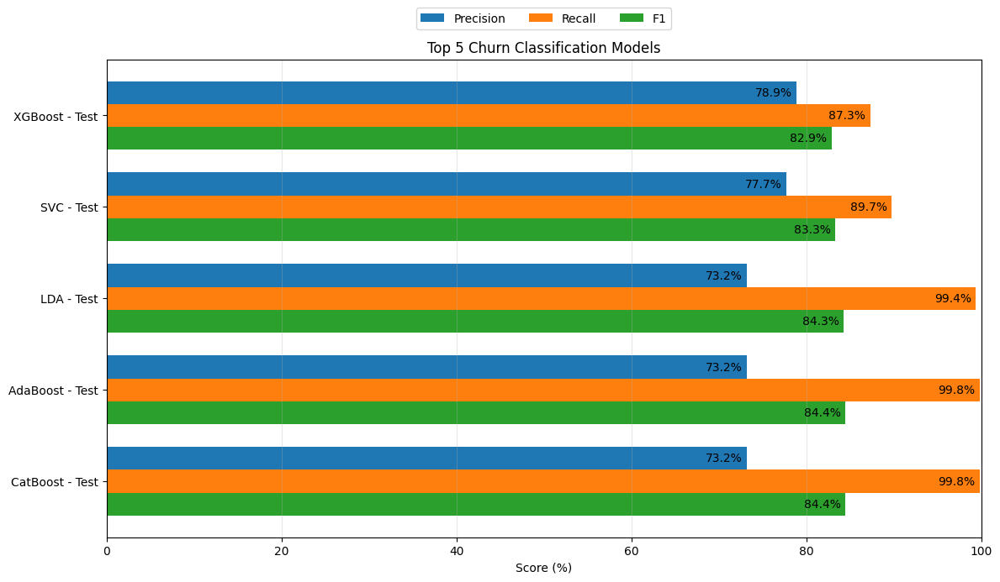

In [144]:
# ============================================================
# FINAL MODEL COMPARISON — TOP 5 MODELS
# TEST SET — Precision vs Recall vs F1
# ============================================================

# Combine all TEST results
all_model_results = pd.DataFrame([
    xgb_test_results,
    gb_test_results,
    catboost_test_results,
    rf_test_results,
    lgbm_test_results,
    ada_test_results,
    svc_test_results,
    lda_test_results
])

# Sort by F1-score and select the top 5 models
top_5_models = (
    all_model_results
    .sort_values(by='f1', ascending=False)
    .head(5)
    .copy()
)

# Convert metrics to percentages
top_5_models[['precision', 'recall', 'f1']] *= 100

# Display the top 5 models table
print("TOP 5 MODELS BASED ON F1-SCORE — TEST SET")

display(
    top_5_models[
        ['model', 'precision', 'recall', 'f1',
         'accuracy', 'roc_auc', 'pr_auc']
    ].round(4)
)

# ============================================================
# CREATE THE BAR CHART
# ============================================================

plt.figure(figsize=(12, 7))

y = np.arange(len(top_5_models))
bar_height = 0.25

# Precision
plt.barh(
    y + bar_height,
    top_5_models['precision'],
    height=bar_height,
    label='Precision'
)

# Recall
plt.barh(
    y,
    top_5_models['recall'],
    height=bar_height,
    label='Recall'
)

# F1
plt.barh(
    y - bar_height,
    top_5_models['f1'],
    height=bar_height,
    label='F1'
)

# Add percentage values on bars
for i, value in enumerate(top_5_models['precision']):
    plt.text(
        value - 0.5,
        i + bar_height,
        f'{value:.1f}%',
        va='center',
        ha='right',
        fontsize=10
    )

for i, value in enumerate(top_5_models['recall']):
    plt.text(
        value - 0.5,
        i,
        f'{value:.1f}%',
        va='center',
        ha='right',
        fontsize=10
    )

for i, value in enumerate(top_5_models['f1']):
    plt.text(
        value - 0.5,
        i - bar_height,
        f'{value:.1f}%',
        va='center',
        ha='right',
        fontsize=10
    )

# Labels and formatting
plt.yticks(y, top_5_models['model'])
plt.xlabel('Score (%)')

plt.title(
    'Top 5 Churn Classification Models'
)

plt.xlim(0, 100)

plt.legend(
    loc='upper center',
    bbox_to_anchor=(0.5, 1.12),
    ncol=3
)

plt.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

TOP 5 MODELS BASED ON F1-SCORE — TEST SET


,model,precision,recall,f1,accuracy,roc_auc,pr_auc
2,CatBoost - Test,73.1627,99.8209,84.4377,0.8630,0.9482,0.8917
5,AdaBoost - Test,73.1627,99.8209,84.4377,0.8630,0.9567,0.8933
7,LDA - Test,73.1707,99.3733,84.2825,0.8620,0.9558,0.9191
6,SVC - Test,77.6744,89.7046,83.2572,0.8657,0.9519,0.9093
0,XGBoost - Test,78.8835,87.2874,82.8729,0.8657,0.9571,0.9214


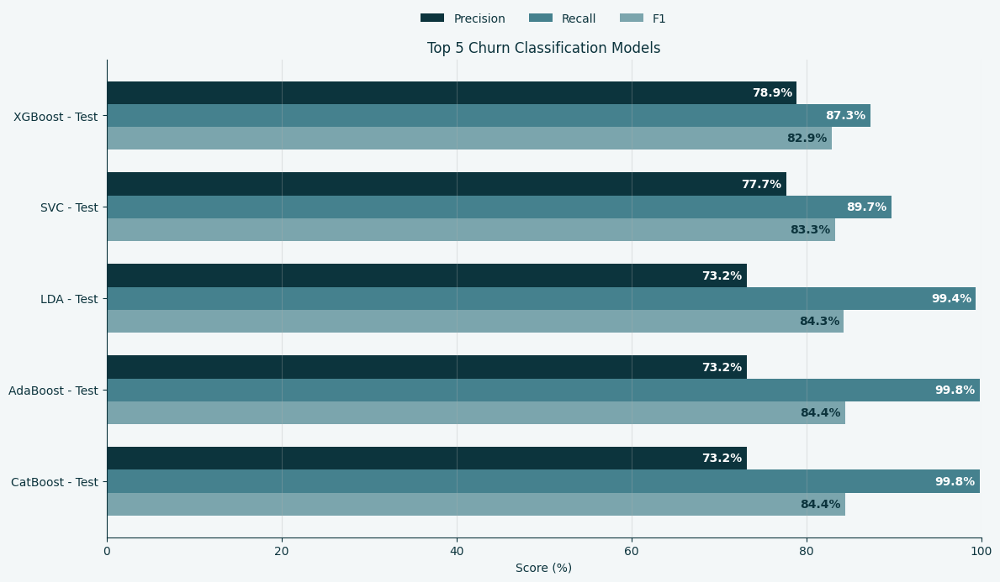

In [145]:
# ============================================================
# FINAL MODEL COMPARISON — TOP 5 MODELS
# TEST SET — Precision vs Recall vs F1
# ============================================================

# Combine all TEST results
all_model_results = pd.DataFrame([
    xgb_test_results,
    gb_test_results,
    catboost_test_results,
    rf_test_results,
    lgbm_test_results,
    ada_test_results,
    svc_test_results,
    lda_test_results
])

# Sort by F1-score and select the top 5 models
top_5_models = (
    all_model_results
    .sort_values(by='f1', ascending=False)
    .head(5)
    .copy()
)

# Convert metrics to percentages
top_5_models[['precision', 'recall', 'f1']] *= 100

# Display the top 5 models table
print("TOP 5 MODELS BASED ON F1-SCORE — TEST SET")

display(
    top_5_models[
        ['model', 'precision', 'recall', 'f1',
         'accuracy', 'roc_auc', 'pr_auc']
    ].round(4)
)

# ============================================================
# CREATE THE BAR CHART — colors matched to presentation template
# ============================================================

# Colors sampled directly from the slide template
DARK_NAVY   = '#0c343d'   # Precision
MEDIUM_TEAL = '#45818e'   # Recall
LIGHT_TEAL  = '#7ba5ad'   # F1
BG_COLOR    = '#f3f7f8'

fig, ax = plt.subplots(figsize=(12, 7))

y = np.arange(len(top_5_models))
bar_height = 0.25

# Precision
ax.barh(
    y + bar_height,
    top_5_models['precision'],
    height=bar_height,
    label='Precision',
    color=DARK_NAVY
)

# Recall
ax.barh(
    y,
    top_5_models['recall'],
    height=bar_height,
    label='Recall',
    color=MEDIUM_TEAL
)

# F1
ax.barh(
    y - bar_height,
    top_5_models['f1'],
    height=bar_height,
    label='F1',
    color=LIGHT_TEAL
)

# Add percentage values on bars
for i, value in enumerate(top_5_models['precision']):
    ax.text(
        value - 0.5,
        i + bar_height,
        f'{value:.1f}%',
        va='center',
        ha='right',
        fontsize=10,
        color='white',
        fontweight='bold'
    )

for i, value in enumerate(top_5_models['recall']):
    ax.text(
        value - 0.5,
        i,
        f'{value:.1f}%',
        va='center',
        ha='right',
        fontsize=10,
        color='white',
        fontweight='bold'
    )

for i, value in enumerate(top_5_models['f1']):
    ax.text(
        value - 0.5,
        i - bar_height,
        f'{value:.1f}%',
        va='center',
        ha='right',
        fontsize=10,
        color=DARK_NAVY,
        fontweight='bold'
    )

# Labels and formatting
ax.set_yticks(y)
ax.set_yticklabels(top_5_models['model'], color=DARK_NAVY)
ax.set_xlabel('Score (%)', color=DARK_NAVY)

ax.set_title(
    'Top 5 Churn Classification Models',
    color=DARK_NAVY
)

ax.set_xlim(0, 100)

ax.legend(
    loc='upper center',
    bbox_to_anchor=(0.5, 1.12),
    ncol=3,
    frameon=False,
    labelcolor=DARK_NAVY
)

ax.tick_params(colors=DARK_NAVY)
ax.spines[['top', 'right']].set_visible(False)
ax.spines[['left', 'bottom']].set_color(DARK_NAVY)
ax.grid(axis='x', alpha=0.3)
ax.set_facecolor(BG_COLOR)
fig.patch.set_facecolor(BG_COLOR)

plt.tight_layout()
plt.show()